(500, 4, 64)
(128000,)
(2049, 251)


C:\Users\melih\AppData\Local\Temp\ipykernel_5740\3915854645.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


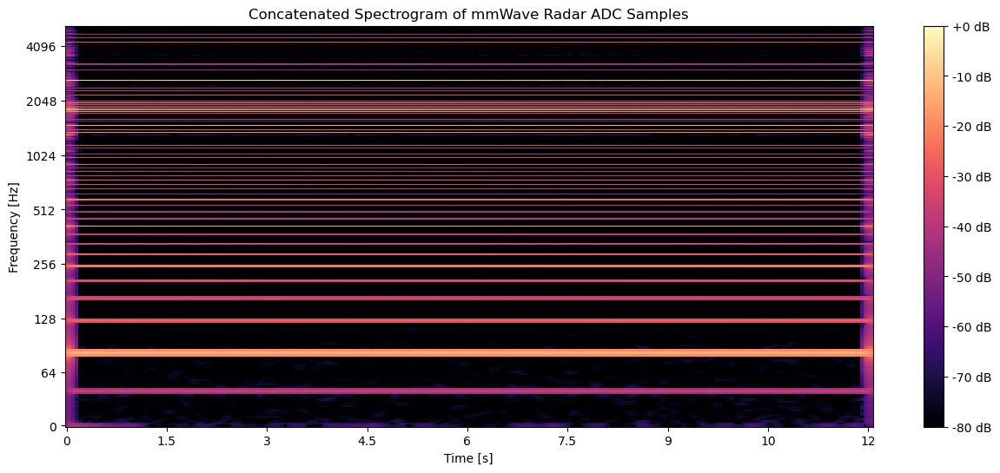

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000

adc_data = np.fromfile("radar bins/combined_output_Raw_0.bin", dtype=np.int16)

adc_data_padded = np.ones(7100*4*256*1*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(7100, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                num_rx=4, num_samples=256)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 100  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


In [39]:
!pip install praat-parselmouth

  Obtaining dependency information for praat-parselmouth from https://files.pythonhosted.org/packages/07/08/61b1b32f8bcf9d8dfd72cdafbefbe501a09d0e7ce700252bd41637bb8353/praat_parselmouth-0.4.4-cp311-cp311-win_amd64.whl.metadata
   ---------------------------------------- 0.0/8.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/8.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/8.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/8.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/8.9 MB 330.3 kB/s eta 0:00:27
   ---------------------------------------- 0.1/8.9 MB 508.4 kB/s eta 0:00:18
   ---------------------------------------- 0.1/8.9 MB 590.8 kB/s eta 0:00:15
    --------------------------------------- 0.2/8.9 MB 807.1 kB/s eta 0:00:11
   - -------------------------------------- 0.2/8.9 MB 846.9 kB/s eta 0:00:11
   - -------------------------------------- 0.3/8.9 MB 853.3 kB/s eta 0:00:11
   - -----------------------

(2, 4609812)


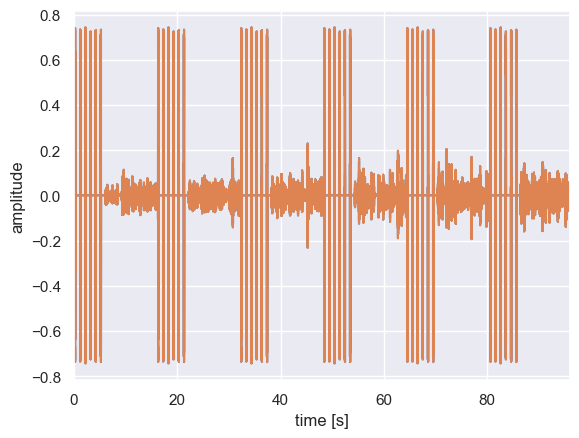

In [43]:
import parselmouth

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set() # Use seaborn's default style to make attractive graphs

# Plot nice figures using Python's "standard" matplotlib library
snd = parselmouth.Sound("combined_output_iscorrect.wav")
print(snd.values.shape)
plt.figure()
plt.plot(snd.xs(), snd.values.T)
plt.xlim([snd.xmin, snd.xmax])
plt.xlabel("time [s]")
plt.ylabel("amplitude")
plt.show() # or plt.savefig("sound.png"), or plt.savefig("sound.pdf")

(7100, 256)
(1664000,)


C:\Users\yapaynazar\AppData\Local\Temp\ipykernel_17872\3002467654.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean[600:,:].flatten().astype(np.float32)


(2049, 3251)


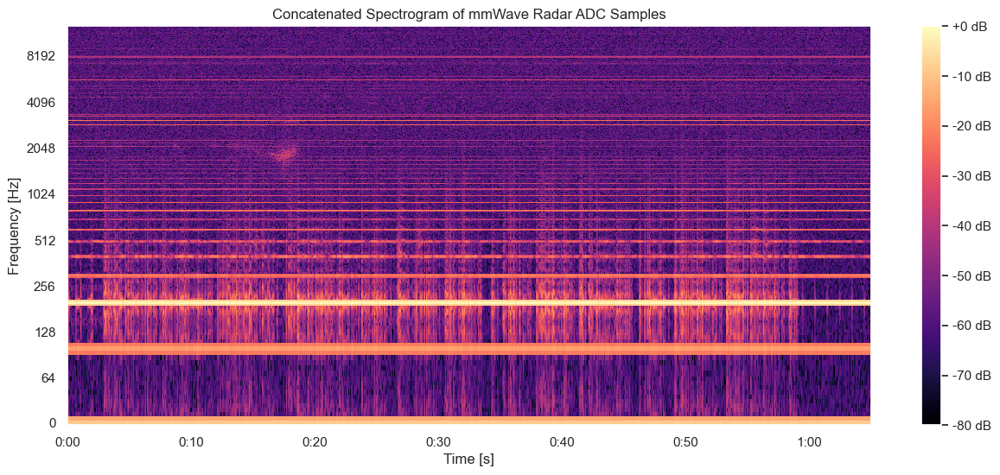

In [63]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000

adc_data = np.fromfile("radar bins/combined_output_Raw_0.bin", dtype=np.int16)

adc_data_padded = np.ones(7100*4*256*1*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(7100, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                num_rx=4, num_samples=256)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean[600:,:].flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 100  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


In [65]:
import librosa

# Load the audio file
y, sr = librosa.load('pingsound.wav', sr=None)

# Get the duration in seconds
duration_sec = librosa.get_duration(y=y, sr=sr)

# Convert to milliseconds
duration_ms = duration_sec * 1000
print(f"Duration: {duration_ms:.2f} ms")

Duration: 6083.63 ms


(650, 256)
(166400,)
(2049, 326)


C:\Users\yapaynazar\AppData\Local\Temp\ipykernel_20364\2929985003.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


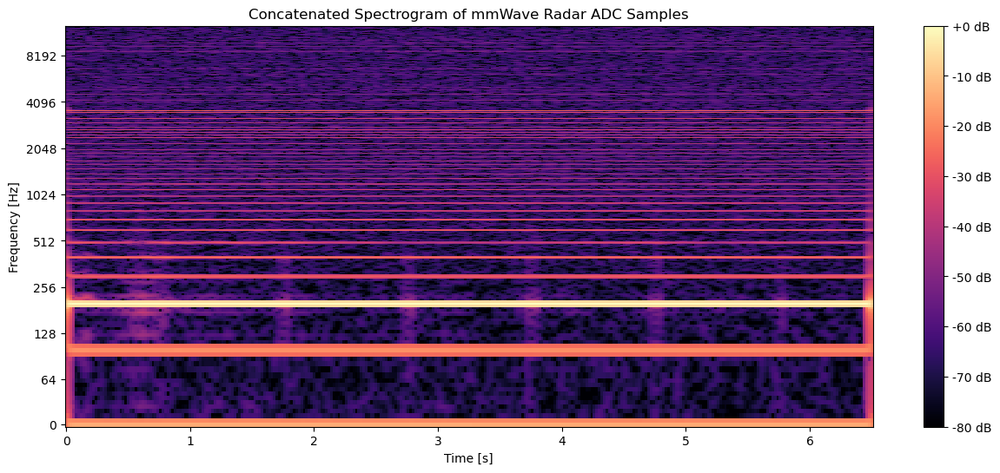

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000

adc_data = np.fromfile("radar bins/onlypingsound_Raw_0.bin", dtype=np.int16)

adc_data_padded = np.ones(650*4*256*1*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(650, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                num_rx=4, num_samples=256)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 100  # Sample rate (in Hz),  (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 
hop_length =512   

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


C:\Users\yapaynazar\AppData\Local\Temp\ipykernel_936\2353518607.py:22: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean[100:,:].flatten().astype(np.float32)


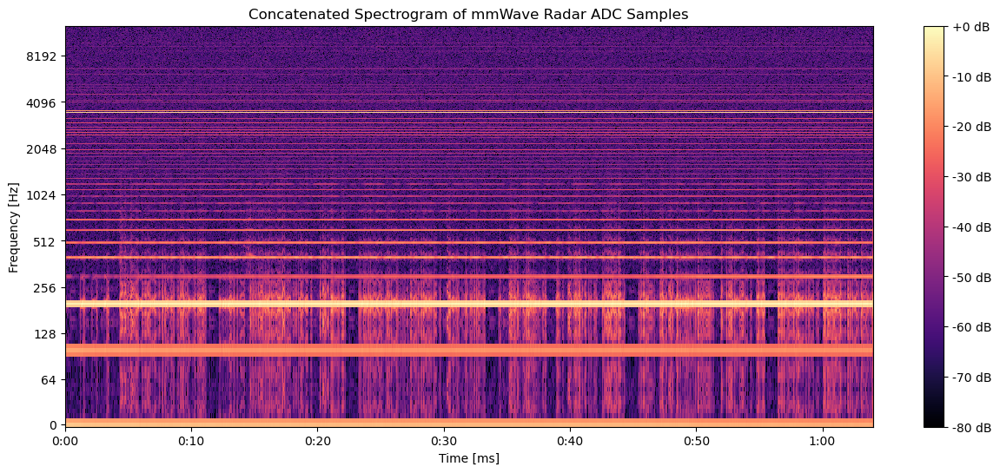

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

# Example code for loading and processing radar data
from mmwave.dataloader import DCA1000

# Load and process ADC data
adc_data = np.fromfile("radar bins/1secondspingandesracoronal_1_Raw_0.bin", dtype=np.int16)

adc_data_padded = np.ones(6500 * 4 * 256 * 1 * 2) * 1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(6500, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                num_rx=4, num_samples=256)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)

# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean[100:,:].flatten().astype(np.float32)

# Parameters
Fs = 256 * 100  # Sample rate (in Hz), (256 / periodicity in seconds = 256/ (1/100) as 10 ms)
n_fft = 4096 
hop_length = 512   

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [ms]')


plt.show()


In [8]:
adc_data_mean.shape


(6500, 256)

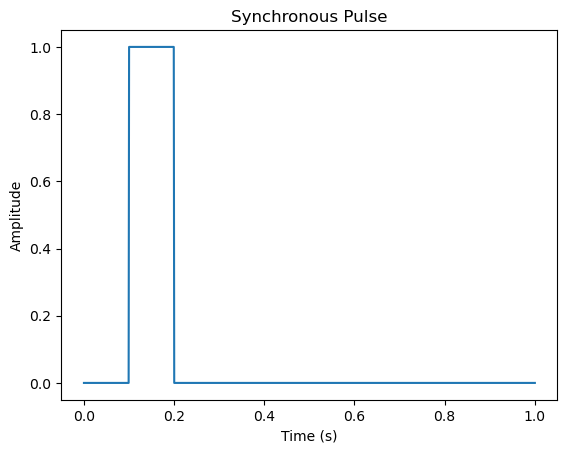

In [13]:
import numpy as np
import matplotlib.pyplot as plt

# Generate a time array
t = np.linspace(0, 1, 1000)

# Generate a synchronous pulse
pulse = np.zeros_like(t)
pulse[100:200] = 1  # Define the pulse width and position

# Plot the pulse
plt.plot(t, pulse)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Synchronous Pulse')
plt.show()


In [24]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

# Example code for loading and processing radar data
from mmwave.dataloader import DCA1000

# Load and process ADC data
adc_data = np.fromfile("radar bins/1secondspingandesracoronal_1_Raw_0.bin", dtype=np.int16)

adc_data_padded = np.ones(6500 * 4 * 256 * 1 * 2) * 1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(6500, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                num_rx=4, num_samples=256)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)


adc_data_mean[1]

array([  56.   +70.75j,   84.25 +13.j  ,  149.5   -8.75j,  201.5  +23.75j,
        223.5  +95.25j,  169.75+184.25j,   80.  +187.5j ,   15.  +129.75j,
         11.   +53.25j,   60.75  -5.25j,  152.5   -4.5j ,  202.5  +76.75j,
        169.  +168.25j,   91.75+187.5j ,   26.5 +167.75j,  -17.25+116.25j,
         20.25 +47.5j ,  100.5  +19.75j,  150.75 +87.25j,  160.5 +162.25j,
         86.75+208.25j,   28.25+207.5j ,  -22.75+144.25j,   24.   +80.5j ,
         90.   +79.5j ,  136.25+131.5j ,  143.75+213.5j ,   89.5 +265.75j,
          2.25+296.5j ,  -51.  +228.j  ,  -56.25+156.25j,   -1.5 +153.75j,
         43.75+153.5j ,   50.  +195.25j,   24.75+269.j  ,  -54.5 +289.5j ,
       -109.5 +248.j  , -118.5 +162.75j,  -83.25+132.5j ,  -27.  +149.5j ,
          8.25+189.5j ,  -38.  +275.75j, -142.5 +288.25j, -207.25+231.25j,
       -234.  +142.j  , -189.25 +62.j  ,  -87.25 +31.25j,  -12.5 +116.75j,
        -52.  +212.j  , -119.5 +250.75j, -220.5 +222.75j, -272.5 +150.75j,
       -249.5  +44.25j, -

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from mmwave.dataloader import DCA1000
import gc
# Example code for loading and processing radar data
consonants = {'p'}

for i in range(1096, 1631):
    for consonant in consonants:

#         fpath = f'C:\\ti\\mmwave_studio_02_01_01_00\\mmWaveStudio\\PostProc\\consonants_correct\\{consonant}\\adc_data_{i}_Raw_0.bin'
        fpath = f'D:\\consonanats_correct\\{consonant}\\adc_data_{i}_Raw_0.bin'

        print(fpath)
        adc_data = np.fromfile(fpath, dtype=np.int16)

        adc_data_padded = np.ones(1000 * 4 * 256 * 1 * 2) * 1E-8
        adc_data_padded[:adc_data.shape[0]] = adc_data        
        adc_data = adc_data_padded.reshape(1000, -1)

        adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                        num_rx=4, num_samples=256)
        adc_data_sq = np.squeeze(adc_data)
        adc_data_mean = np.mean(adc_data_sq, axis=1)

        # Flatten the frames into a single 1D array
        flattened_frames = adc_data_mean[:,:].flatten().astype(np.float32)

        # Parameters
        Fs = 256 * 500  # Sample rate (in Hz)
        n_fft = 4096 
        hop_length = 512   

        # Compute the STFT on the flattened data
        D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
        S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

        # Plot the concatenated spectrogram
        plt.figure(figsize=(15, 6))
        librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
        plt.colorbar(format='%+2.0f dB')
        plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
        plt.ylabel('Frequency [Hz]')
        plt.xlabel('Time [ms]')

        # Save the plot instead of showing it
        output_path = f'C:\\Users\\yapaynazar\\Desktop\\ilhan radar praat\\radarspectrogramsultrasuite\\{consonant}\\spectrogram_{i}.png'
        plt.savefig(output_path)
        plt.close()  # Close the figure to avoid memory issues
        del adc_data, adc_data_padded, flattened_frames, D, S_db
        gc.collect()


D:\consonanats_correct\p\adc_data_1096_Raw_0.bin


C:\Users\yapaynazar\AppData\Local\Temp\ipykernel_59644\2161450519.py:29: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean[:,:].flatten().astype(np.float32)


D:\consonanats_correct\p\adc_data_1097_Raw_0.bin
D:\consonanats_correct\p\adc_data_1098_Raw_0.bin
D:\consonanats_correct\p\adc_data_1099_Raw_0.bin
D:\consonanats_correct\p\adc_data_1100_Raw_0.bin
D:\consonanats_correct\p\adc_data_1101_Raw_0.bin
D:\consonanats_correct\p\adc_data_1102_Raw_0.bin
D:\consonanats_correct\p\adc_data_1103_Raw_0.bin
D:\consonanats_correct\p\adc_data_1104_Raw_0.bin
D:\consonanats_correct\p\adc_data_1105_Raw_0.bin
D:\consonanats_correct\p\adc_data_1106_Raw_0.bin
D:\consonanats_correct\p\adc_data_1107_Raw_0.bin
D:\consonanats_correct\p\adc_data_1108_Raw_0.bin
D:\consonanats_correct\p\adc_data_1109_Raw_0.bin
D:\consonanats_correct\p\adc_data_1110_Raw_0.bin
D:\consonanats_correct\p\adc_data_1111_Raw_0.bin
D:\consonanats_correct\p\adc_data_1112_Raw_0.bin
D:\consonanats_correct\p\adc_data_1113_Raw_0.bin
D:\consonanats_correct\p\adc_data_1114_Raw_0.bin
D:\consonanats_correct\p\adc_data_1115_Raw_0.bin
D:\consonanats_correct\p\adc_data_1116_Raw_0.bin
D:\consonanats_corre

D:\consonanats_correct\p\adc_data_1265_Raw_0.bin
D:\consonanats_correct\p\adc_data_1266_Raw_0.bin
D:\consonanats_correct\p\adc_data_1267_Raw_0.bin
D:\consonanats_correct\p\adc_data_1268_Raw_0.bin
D:\consonanats_correct\p\adc_data_1269_Raw_0.bin
D:\consonanats_correct\p\adc_data_1270_Raw_0.bin
D:\consonanats_correct\p\adc_data_1271_Raw_0.bin
D:\consonanats_correct\p\adc_data_1272_Raw_0.bin
D:\consonanats_correct\p\adc_data_1273_Raw_0.bin
D:\consonanats_correct\p\adc_data_1274_Raw_0.bin
D:\consonanats_correct\p\adc_data_1275_Raw_0.bin
D:\consonanats_correct\p\adc_data_1276_Raw_0.bin
D:\consonanats_correct\p\adc_data_1277_Raw_0.bin
D:\consonanats_correct\p\adc_data_1278_Raw_0.bin
D:\consonanats_correct\p\adc_data_1279_Raw_0.bin
D:\consonanats_correct\p\adc_data_1280_Raw_0.bin
D:\consonanats_correct\p\adc_data_1281_Raw_0.bin
D:\consonanats_correct\p\adc_data_1282_Raw_0.bin
D:\consonanats_correct\p\adc_data_1283_Raw_0.bin
D:\consonanats_correct\p\adc_data_1284_Raw_0.bin
D:\consonanats_corre

D:\consonanats_correct\p\adc_data_1433_Raw_0.bin
D:\consonanats_correct\p\adc_data_1434_Raw_0.bin
D:\consonanats_correct\p\adc_data_1435_Raw_0.bin
D:\consonanats_correct\p\adc_data_1436_Raw_0.bin
D:\consonanats_correct\p\adc_data_1437_Raw_0.bin
D:\consonanats_correct\p\adc_data_1438_Raw_0.bin
D:\consonanats_correct\p\adc_data_1439_Raw_0.bin
D:\consonanats_correct\p\adc_data_1440_Raw_0.bin
D:\consonanats_correct\p\adc_data_1441_Raw_0.bin
D:\consonanats_correct\p\adc_data_1442_Raw_0.bin
D:\consonanats_correct\p\adc_data_1443_Raw_0.bin
D:\consonanats_correct\p\adc_data_1444_Raw_0.bin
D:\consonanats_correct\p\adc_data_1445_Raw_0.bin
D:\consonanats_correct\p\adc_data_1446_Raw_0.bin
D:\consonanats_correct\p\adc_data_1447_Raw_0.bin
D:\consonanats_correct\p\adc_data_1448_Raw_0.bin
D:\consonanats_correct\p\adc_data_1449_Raw_0.bin
D:\consonanats_correct\p\adc_data_1450_Raw_0.bin
D:\consonanats_correct\p\adc_data_1451_Raw_0.bin
D:\consonanats_correct\p\adc_data_1452_Raw_0.bin
D:\consonanats_corre

D:\consonanats_correct\p\adc_data_1601_Raw_0.bin
D:\consonanats_correct\p\adc_data_1602_Raw_0.bin
D:\consonanats_correct\p\adc_data_1603_Raw_0.bin
D:\consonanats_correct\p\adc_data_1604_Raw_0.bin
D:\consonanats_correct\p\adc_data_1605_Raw_0.bin
D:\consonanats_correct\p\adc_data_1606_Raw_0.bin
D:\consonanats_correct\p\adc_data_1607_Raw_0.bin
D:\consonanats_correct\p\adc_data_1608_Raw_0.bin
D:\consonanats_correct\p\adc_data_1609_Raw_0.bin
D:\consonanats_correct\p\adc_data_1610_Raw_0.bin
D:\consonanats_correct\p\adc_data_1611_Raw_0.bin
D:\consonanats_correct\p\adc_data_1612_Raw_0.bin
D:\consonanats_correct\p\adc_data_1613_Raw_0.bin
D:\consonanats_correct\p\adc_data_1614_Raw_0.bin
D:\consonanats_correct\p\adc_data_1615_Raw_0.bin
D:\consonanats_correct\p\adc_data_1616_Raw_0.bin
D:\consonanats_correct\p\adc_data_1617_Raw_0.bin
D:\consonanats_correct\p\adc_data_1618_Raw_0.bin
D:\consonanats_correct\p\adc_data_1619_Raw_0.bin
D:\consonanats_correct\p\adc_data_1620_Raw_0.bin
D:\consonanats_corre

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from mmwave.dataloader import DCA1000
import gc
import os

# Example code for loading and processing radar data
#consonants = {'b','d','f','g','k','p','r','s','t','v','z'}
consonants = {'t','d','k','g'}
subjects = {'burak','ezgi','ilhan','samet','umit'}


for subject in subjects:
    for i in range(1, 100):
        for consonant in consonants:

    #         fpath = f'C:\\ti\\mmwave_studio_02_01_01_00\\mmWaveStudio\\PostProc\\consonants_correct\\{consonant}\\adc_data_{i}_Raw_0.bin'
            fpath = f'D:\\ilhan_human_collected\\{subject}\\{consonant}\\adc_data_{i}_Raw_0.bin'

            print(fpath)
            adc_data = np.fromfile(fpath, dtype=np.int16)
            frame_no = 2000
            adc_data_padded = np.ones(frame_no * 4 * 256 * 1 * 2) * 1E-8
            adc_data_padded[:adc_data.shape[0]] = adc_data        
            adc_data = adc_data_padded.reshape(frame_no, -1)

            adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                            num_rx=4, num_samples=256)
            adc_data_sq = np.squeeze(adc_data)
            adc_data_mean = np.mean(adc_data_sq, axis=1)

            # Flatten the frames into a single 1D array
            flattened_frames = adc_data_mean[:,:].flatten().astype(np.float32)

            # Parameters
            Fs = 256 * 1000  # Sample rate (in Hz) ()
            n_fft = 4096 * 8
            hop_length = 128 * 4    

            # Compute the STFT on the flattened data
            D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
            #S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
            S_db = librosa.amplitude_to_db(np.abs(D))

            # Plot the concatenated spectrogram
            plt.figure(figsize=(15, 10))
            librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
            plt.colorbar(format='%+2.0f dB')
            plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
            plt.ylabel('Frequency [Hz]')
            plt.xlabel('Time [sec]')



            # Define the output path
            output_path = f'D:\\ilhan_human_collected_spectrograms\\{subject}\\{consonant}\\spectrogram_{subject}_{consonant}_{i}.png'

            # Extract the directory from the output path
            directory = os.path.dirname(output_path)

            # Create the directory if it doesn't exist
            os.makedirs(directory, exist_ok=True)

            # Save the plot
            plt.savefig(output_path)
            plt.close()  # Close the figure to avoid memory issues




D:\ilhan_human_collected\umit\t\adc_data_1_Raw_0.bin


C:\Users\yapaynazar\AppData\Local\Temp\ipykernel_8472\663016965.py:35: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean[:,:].flatten().astype(np.float32)


D:\ilhan_human_collected\umit\g\adc_data_1_Raw_0.bin
D:\ilhan_human_collected\umit\d\adc_data_1_Raw_0.bin
D:\ilhan_human_collected\umit\k\adc_data_1_Raw_0.bin


In [17]:
adc_data_sq.shape

(10000, 4, 256)

In [ ]:
import multiprocessing
from concurrent.futures import ProcessPoolExecutor
from processing import process_my_file  # Import the function from processing.py

# Force the spawn start method (sometimes needed in notebooks)
multiprocessing.set_start_method('spawn', force=True)

# Define subjects and consonantsaudio

subjects = {'burak', 'ezgi', 'samet', 'umit'}
consonants = {'t', 'd', 'k', 'g'}
subjects = {'samet'}

def run_multiprocessing():
    with ProcessPoolExecutor() as executor:
        futures = [
            executor.submit(process_my_file, subject, consonant, i)
            for subject in subjects
            for consonant in consonants
            for i in range(1, 100)
        ]
        # Optionally wait for all tasks to complete and handle any exceptions
        for future in futures:
            future.result()

# Run the multiprocessing function
run_multiprocessing()


(200, 256)
(51200,)
(2049, 101)


C:\Users\yapaynazar\AppData\Local\Temp\ipykernel_22068\2290821258.py:23: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


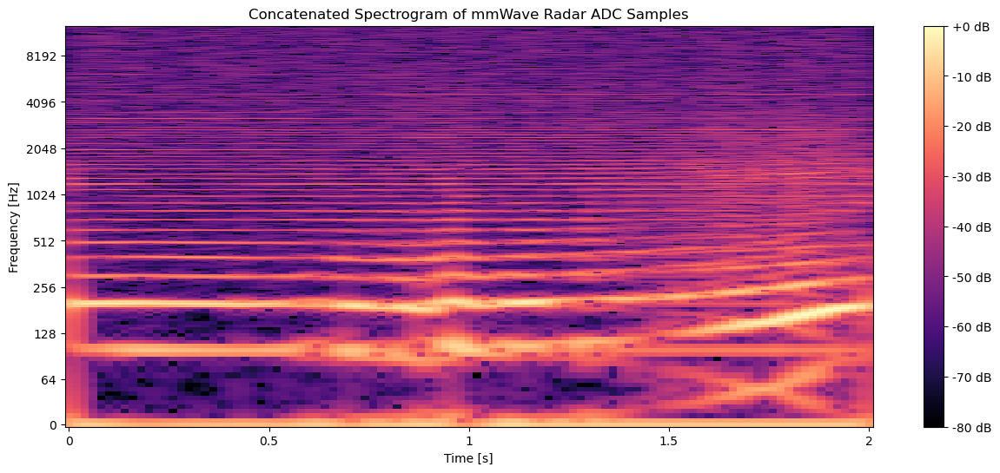

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("D:\\ilhan_human_collected\\X\\t\\adc_data_2_Raw_0.bin", dtype=np.int16)

adc_data_padded = np.ones(200*4*256*1*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(200, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                num_rx=4, num_samples=256)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 100  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


(200, 256)
(51200,)
(2049, 101)


C:\Users\yapaynazar\AppData\Local\Temp\ipykernel_1320\3701545271.py:23: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


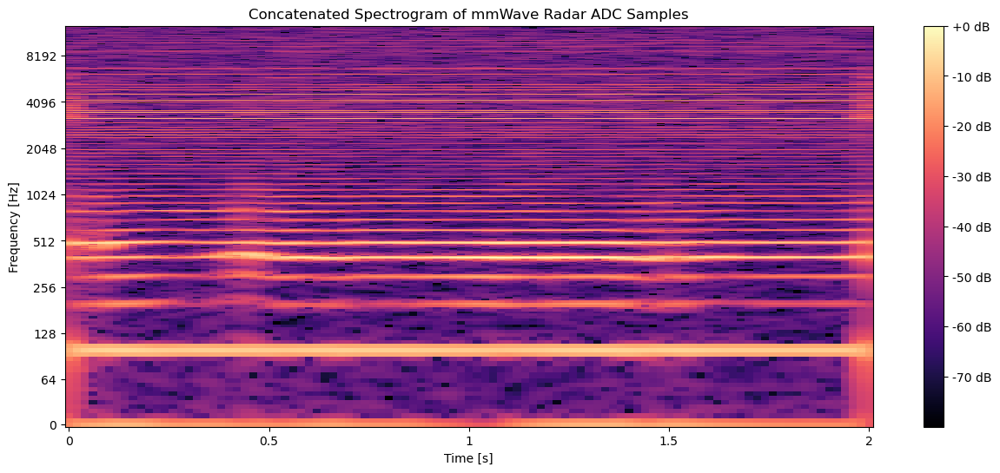

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("test2_adc_data_Raw_0.bin", dtype=np.int16)

adc_data_padded = np.ones(200*4*256*1*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(200, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                num_rx=4, num_samples=256)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 100  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


In [26]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("test3_adc_data_Raw_0.bin", dtype=np.int16)

adc_data_padded = np.ones(1000*4*256*1*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(1000, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                num_rx=4, num_samples=256)
adc_data_sq = np.squeeze(adc_data)
print(adc_data_sq.shape)
# adc_data_mean = np.mean(adc_data_sq, axis=1)
# print(adc_data_mean.shape)
# # Example data: replace this with your actual 5000 frames of 256 ADC samples


# # Flatten the frames into a single 1D array
# flattened_frames = adc_data_mean.flatten().astype(np.float32)
# print(flattened_frames.shape)
# # Parameters
# Fs = 256 * 100  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
# n_fft = 4096 
# hop_length =512   # Adjust based on your overlap and window size

# # Compute the STFT on the flattened data
# D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
# S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
# print(S_db.shape)

# # Plot the concatenated spectrogram
# plt.figure(figsize=(15, 6))
# librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
# plt.colorbar(format='%+2.0f dB')
# plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
# plt.ylabel('Frequency [Hz]')
# plt.xlabel('Time [s]')
# plt.show()


(1000, 4, 256)


(1000, 1, 4, 256)
(1000, 256)
(256000,)
(4097, 501)


C:\Users\yapaynazar\AppData\Local\Temp\ipykernel_1320\1115529295.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


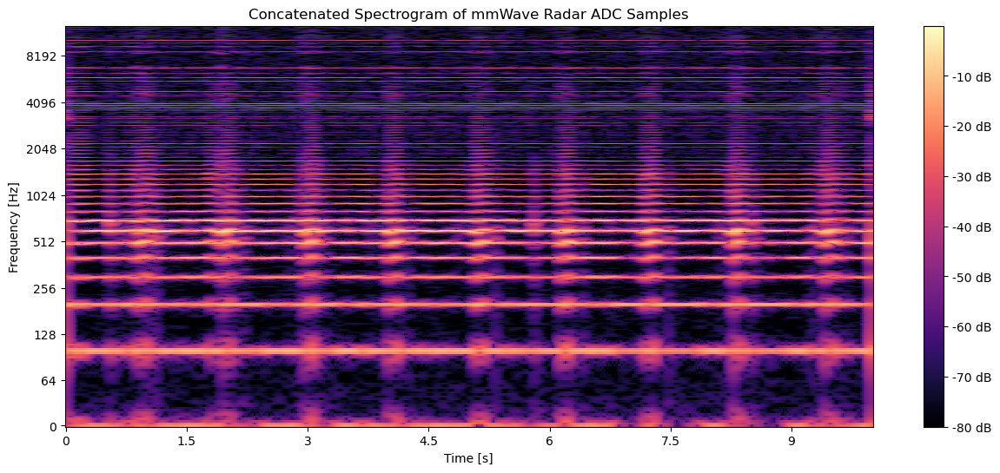

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("test4_adc_data_Raw_0.bin", dtype=np.int16)

adc_data_padded = np.ones(1000*4*256*16*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(1000, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=16,
                                num_rx=4, num_samples=256)

adc_data = np.mean(adc_data, axis=1, keepdims=True)
print(adc_data.shape)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 100  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 * 2 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


(1000, 1, 4, 256)
(1000, 256)
(256000,)
(4097, 501)


C:\Users\yapaynazar\AppData\Local\Temp\ipykernel_1320\2322768877.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


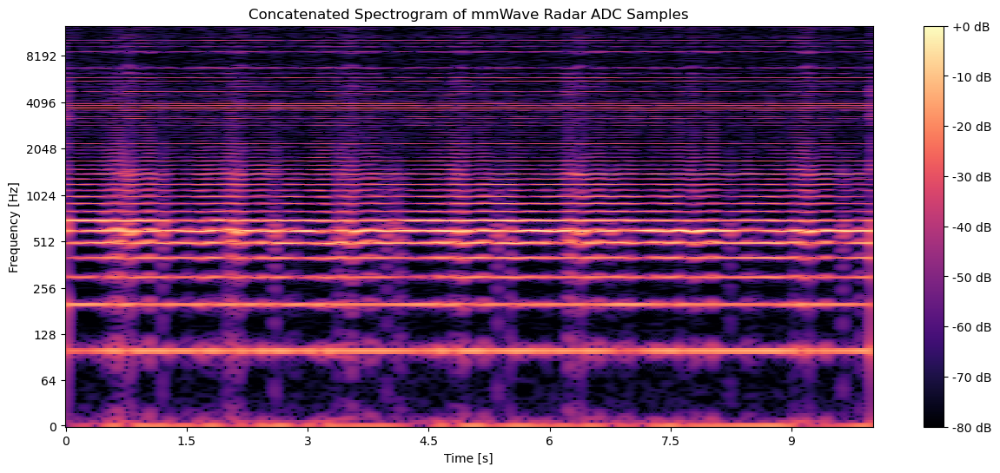

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("test5_adc_data_Raw_0.bin", dtype=np.int16)

adc_data_padded = np.ones(1000*4*256*16*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(1000, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=16,
                                num_rx=4, num_samples=256)

adc_data = np.mean(adc_data, axis=1, keepdims=True)
print(adc_data.shape)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 100  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 * 2 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


(100, 1, 4, 256)
(100, 256)
(25600,)
(2049, 51)


C:\Users\yapaynazar\AppData\Local\Temp\ipykernel_1320\2864450397.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


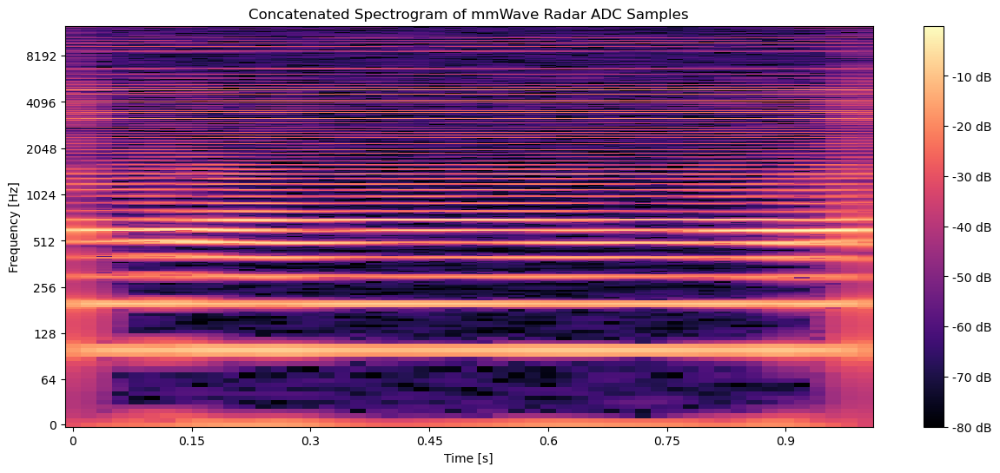

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("test6_adc_data_Raw_0.bin", dtype=np.int16)

adc_data_padded = np.ones(100*4*256*16*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(100, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=16,
                                num_rx=4, num_samples=256)

adc_data = np.mean(adc_data, axis=1, keepdims=True)
print(adc_data.shape)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 100  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096  
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


(100, 1, 4, 256)
(100, 256)
(25600,)
(2049, 51)


C:\Users\yapaynazar\AppData\Local\Temp\ipykernel_1320\3328256688.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


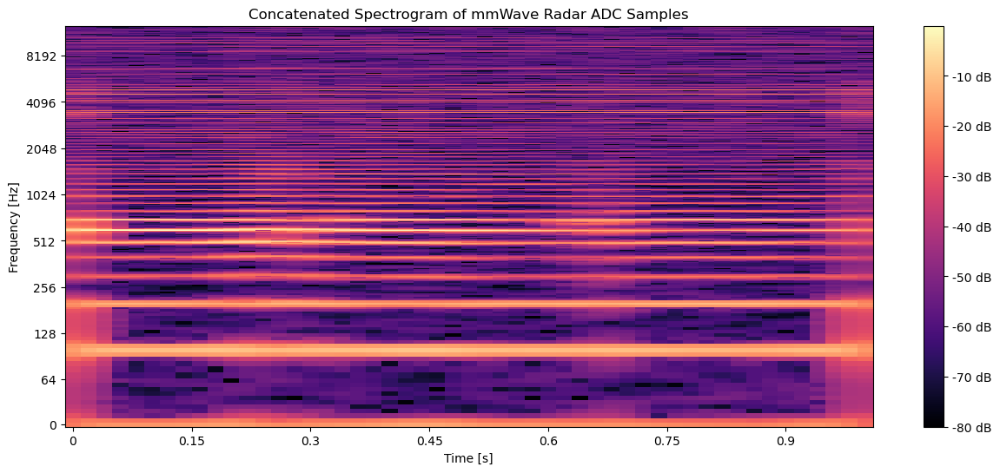

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("test7_adc_data_Raw_0.bin", dtype=np.int16)

adc_data_padded = np.ones(100*4*256*1*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(100, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                num_rx=4, num_samples=256)

adc_data = np.mean(adc_data, axis=1, keepdims=True)
print(adc_data.shape)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 100  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096  
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


(100, 1, 4, 256)
(100, 256)
(25600,)
(2049, 51)


C:\Users\yapaynazar\AppData\Local\Temp\ipykernel_1320\1175703797.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


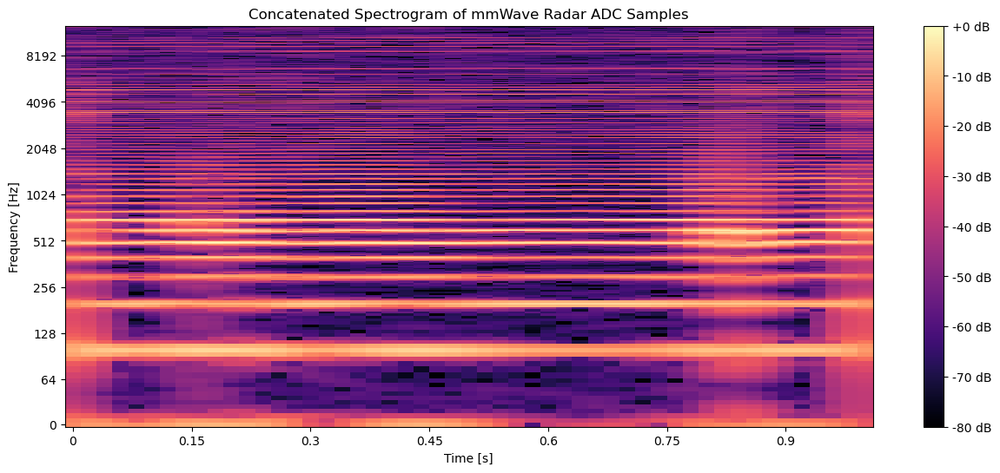

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("vowel_a_100frame_4loop_10ms_Raw_0.bin", dtype=np.int16)

adc_data_padded = np.ones(100*4*256*4*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(100, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=4,
                                num_rx=4, num_samples=256)

adc_data = np.mean(adc_data, axis=1, keepdims=True)
print(adc_data.shape)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 100  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096  
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


(50, 1, 4, 256)
(50, 256)
(12800,)
(2049, 26)


C:\Users\yapaynazar\AppData\Local\Temp\ipykernel_1320\2328733646.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


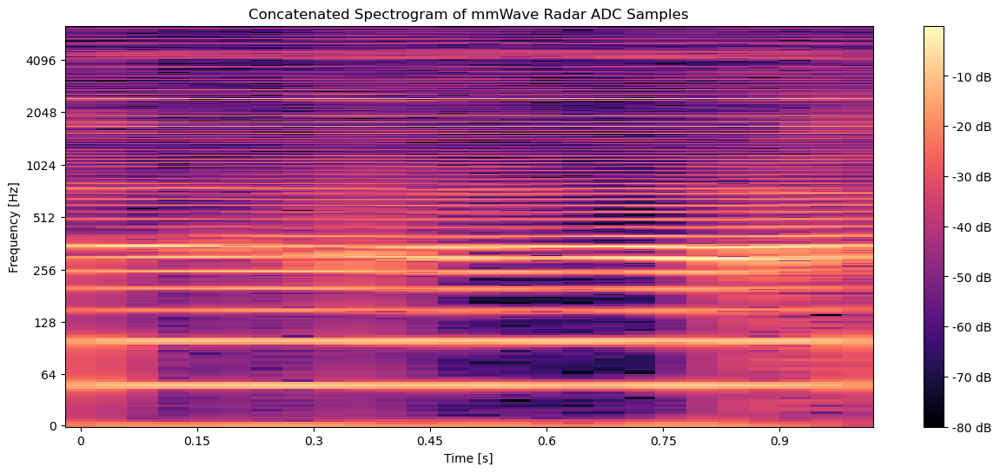

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("vowel_a_50frame_4loop_20ms_Raw_0.bin", dtype=np.int16)

adc_data_padded = np.ones(50*4*256*4*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(50, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=4,
                                num_rx=4, num_samples=256)

adc_data = np.mean(adc_data, axis=1, keepdims=True)
print(adc_data.shape)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 50  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096  
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


(100, 1, 4, 256)
(100, 256)
(25600,)
(2049, 51)


C:\Users\yapaynazar\AppData\Local\Temp\ipykernel_1320\742908291.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


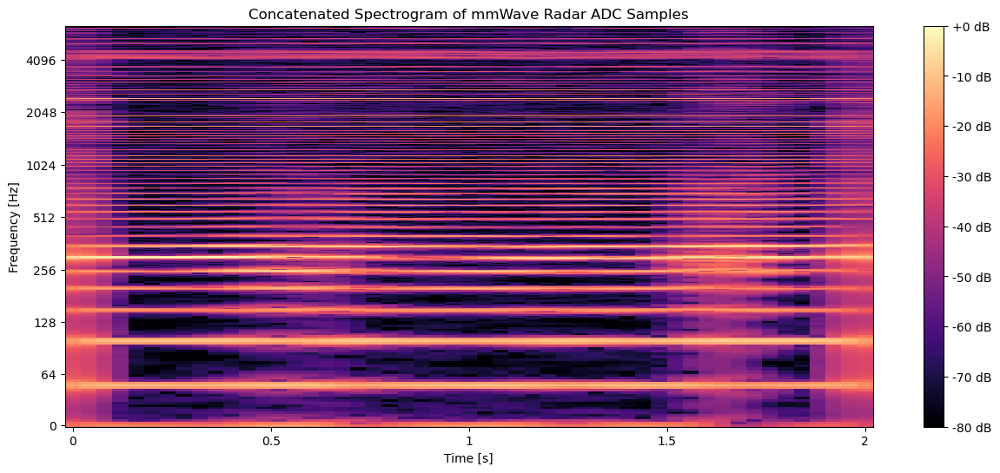

In [41]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("vowel_a_100frame_32loop_10ms_Raw_0.bin", dtype=np.int16)

adc_data_padded = np.ones(100*4*256*32*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(100, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=32,
                                num_rx=4, num_samples=256)

adc_data = np.mean(adc_data, axis=1, keepdims=True)
print(adc_data.shape)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 50  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096  
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


(1000, 1, 4, 256)
(1000, 256)
(256000,)
(4097, 501)


C:\Users\melih\AppData\Local\Temp\ipykernel_14392\287510933.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


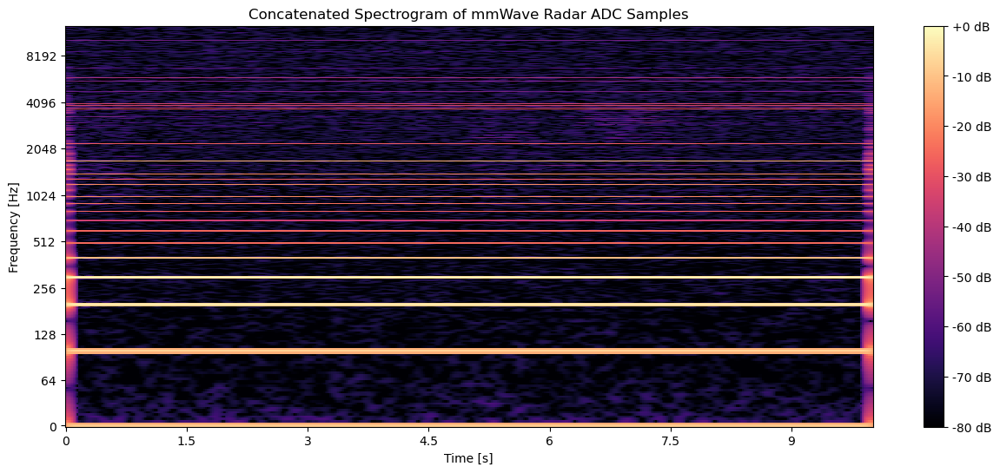

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("phone-no-vibrate-adc256-chirp16-10ms.bin", dtype=np.int16)

adc_data_padded = np.ones(1000*4*256*16*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(1000, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=16,
                                num_rx=4, num_samples=256)

adc_data = np.mean(adc_data, axis=1, keepdims=True)
print(adc_data.shape)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 / (10/1000)  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 * 2 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


(1000, 1, 4, 256)
(1000, 256)
(256000,)
(2049, 501)


C:\Users\melih\AppData\Local\Temp\ipykernel_12124\2801246295.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


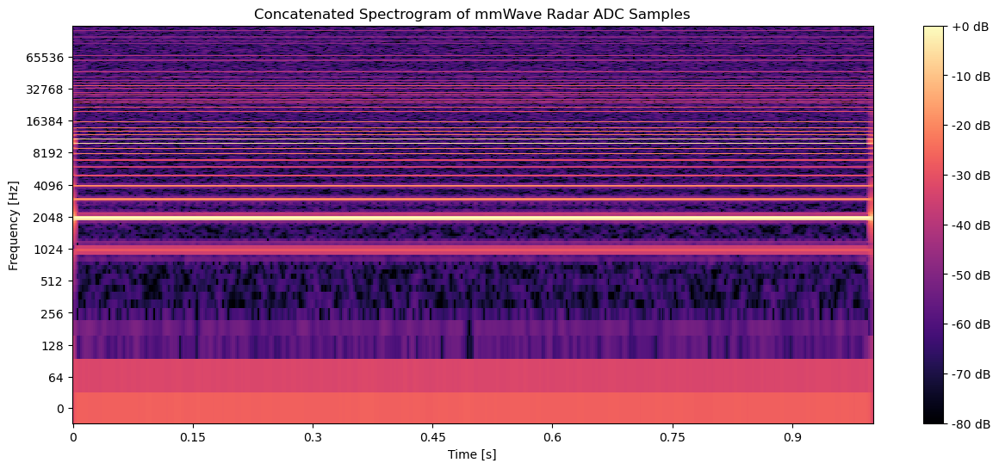

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("adc_data.bin", dtype=np.int16)

adc_data_padded = np.ones(1000*4*256*1*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(1000, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                num_rx=4, num_samples=256)

adc_data = np.mean(adc_data, axis=1, keepdims=True)
print(adc_data.shape)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 1000 # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


(1000, 1, 4, 256)
(1000, 256)
(256000,)
(2049, 501)


C:\Users\melih\AppData\Local\Temp\ipykernel_12124\91608227.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


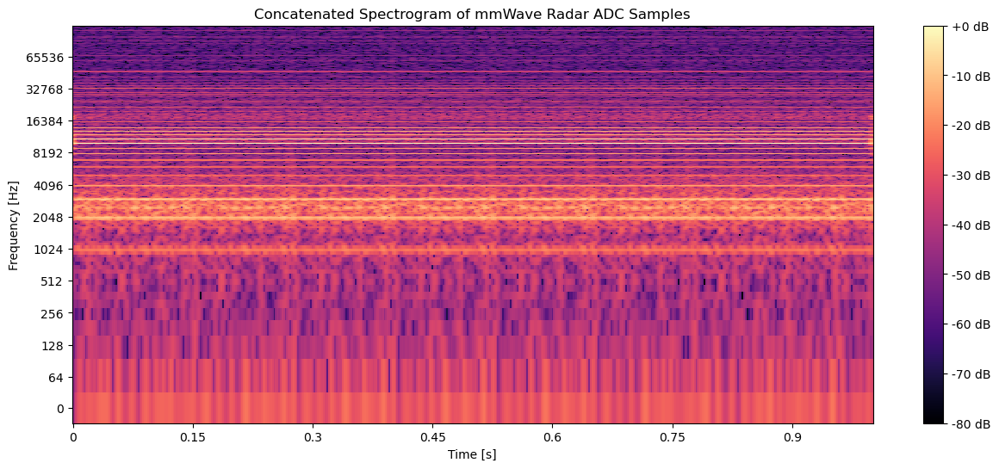

In [44]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("new data\\vantilator-vibration-256adc-1chirp-1000frames-1ms.bin", dtype=np.int16)

adc_data_padded = np.ones(1000*4*256*1*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(1000, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                num_rx=4, num_samples=256)

adc_data = np.mean(adc_data, axis=1, keepdims=True)
print(adc_data.shape)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 1000 # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


C:\Users\melih\AppData\Local\Temp\ipykernel_12124\798322053.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


Signal 1 - min: -75.92, max: 66.32
Signal 2 - min: -64.00, max: 63.18
Spectrogram 1 dB range: 9.2 to 89.2
Spectrogram 2 dB range: 9.0 to 89.0


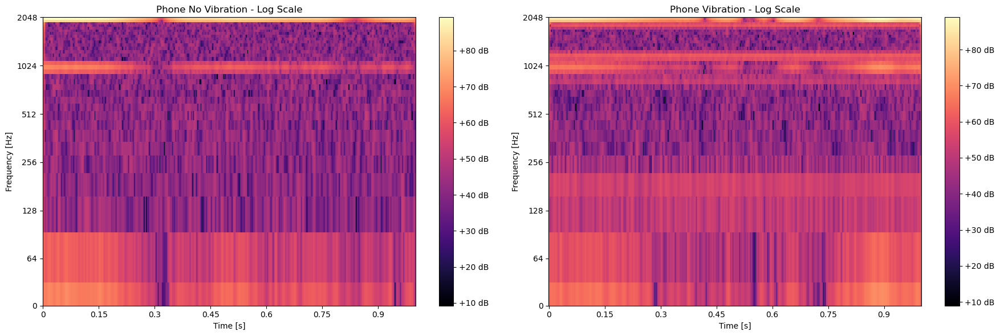

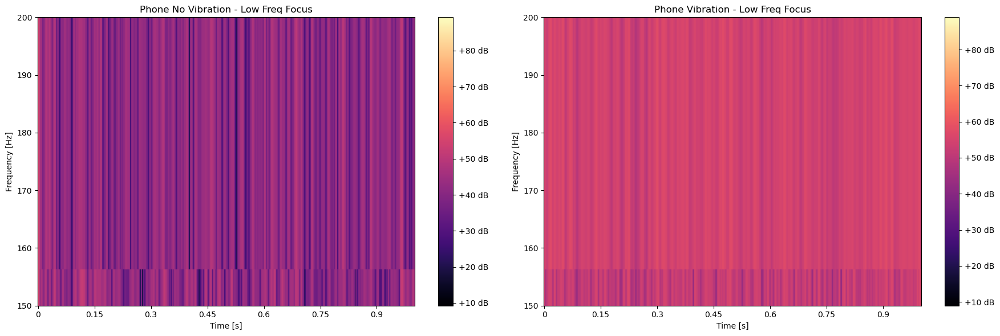

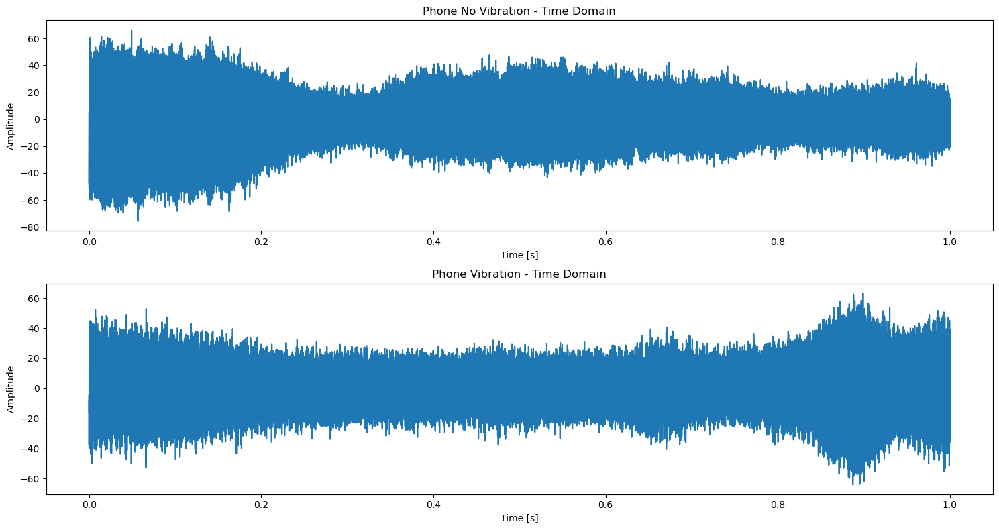

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from mmwave.dataloader import DCA1000

def process_radar_data(filepath, num_frames, num_chirps=1, num_rx=4, num_samples=256):
    """Process radar data and return flattened frames"""
    adc_data = np.fromfile(filepath, dtype=np.int16)
    
    adc_data_padded = np.ones(num_frames * num_rx * num_samples * num_chirps * 2) * 1E-8
    adc_data_padded[:adc_data.shape[0]] = adc_data        
    adc_data = adc_data_padded.reshape(num_frames, -1)
    
    adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=num_chirps,
                                    num_rx=num_rx, num_samples=num_samples)
    adc_data_sq = np.squeeze(adc_data)
    
    # Remove static clutter (mean across frames)
    adc_data_mean_removed = adc_data_sq - np.mean(adc_data_sq, axis=0, keepdims=True)
    adc_data_mean = np.mean(adc_data_mean_removed, axis=1)
    
    # Flatten the frames
    flattened_frames = adc_data_mean.flatten().astype(np.float32)
    flattened_frames = np.nan_to_num(flattened_frames, nan=0.0, posinf=0.0, neginf=0.0)
    
    return flattened_frames

# === Configuration ===
# File 1 - Change these to your actual files
file1_path = "new data\\phone-no-vibration-256adc-1chirp-1000frames-1ms.bin"
file1_frames = 1000
file1_label = "Phone No Vibration"

# File 2 - Change these to your actual files
file2_path = "new data\\phone-vibration-256adc-1chirp-1000frames-1ms.bin"  # Change to your second file
file2_frames = 1000
file2_label = "Phone Vibration"

# === Process both files ===
signal1 = process_radar_data(file1_path, file1_frames)
signal2 = process_radar_data(file2_path, file2_frames)

# === Parameters ===
Fs = 256 * 1000  # Sample rate
n_fft = 4096
hop_length = 512

# === Compute STFT for both ===
D1 = librosa.stft(signal1, n_fft=n_fft, hop_length=hop_length)
D2 = librosa.stft(signal2, n_fft=n_fft, hop_length=hop_length)

S_db1 = librosa.amplitude_to_db(np.abs(D1), ref=1.0)
S_db2 = librosa.amplitude_to_db(np.abs(D2), ref=1.0)

# === Print info ===
print(f"Signal 1 - min: {signal1.min():.2f}, max: {signal1.max():.2f}")
print(f"Signal 2 - min: {signal2.min():.2f}, max: {signal2.max():.2f}")
print(f"Spectrogram 1 dB range: {S_db1.min():.1f} to {S_db1.max():.1f}")
print(f"Spectrogram 2 dB range: {S_db2.min():.1f} to {S_db2.max():.1f}")

# === Plot 1: Side-by-side spectrograms (Log scale) ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[0])
axes[0].set_title(f'{file1_label} - Log Scale')
axes[0].set_ylim([0, 2048])
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[1])
axes[1].set_title(f'{file2_label} - Log Scale')
axes[].set_ylim([0, 2048])
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

# === Plot 2: Side-by-side spectrograms (Linear scale, low frequency focus) ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='linear', ax=axes[0])
axes[0].set_ylim([0, 1000])
axes[0].set_title(f'{file1_label} - Low Freq Focus')
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='linear', ax=axes[1])
axes[1].set_ylim([0, 1000])
axes[1].set_title(f'{file2_label} - Low Freq Focus')
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

# === Plot 3: Time-domain signals comparison ===
fig, axes = plt.subplots(2, 1, figsize=(15, 8))

time1 = np.arange(len(signal1)) / Fs
time2 = np.arange(len(signal2)) / Fs

axes[0].plot(time1, signal1)
axes[0].set_title(f'{file1_label} - Time Domain')
axes[0].set_xlabel('Time [s]')
axes[0].set_ylabel('Amplitude')

axes[1].plot(time2, signal2)
axes[1].set_title(f'{file2_label} - Time Domain')
axes[1].set_xlabel('Time [s]')
axes[1].set_ylabel('Amplitude')

plt.tight_layout()
plt.show()

C:\Users\melih\AppData\Local\Temp\ipykernel_12124\2474757034.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


AMPLITUDE ANALYSIS

Vantilator No Vibration:
  Average Amplitude: 4.9995
  RMS Amplitude: 6.2710
  Min: -29.2542, Max: 30.0123

Vantilator Vibration:
  Average Amplitude: 36.0212
  RMS Amplitude: 45.1900
  Min: -191.5988, Max: 184.9715

Amplitude Ratio (Vibration/No Vibration): 7.20x
RMS Ratio (Vibration/No Vibration): 7.21x

Spectrogram 1 dB range: -7.8 to 72.2
Spectrogram 2 dB range: 14.5 to 94.5


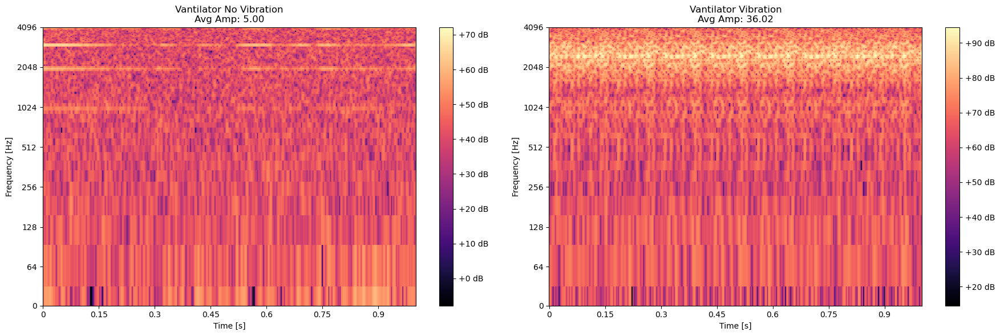

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from mmwave.dataloader import DCA1000

def process_radar_data(filepath, num_frames, num_chirps=1, num_rx=4, num_samples=256):
    """Process radar data and return flattened frames"""
    adc_data = np.fromfile(filepath, dtype=np.int16)
    
    adc_data_padded = np.ones(num_frames * num_rx * num_samples * num_chirps * 2) * 1E-8
    adc_data_padded[:adc_data.shape[0]] = adc_data        
    adc_data = adc_data_padded.reshape(num_frames, -1)
    
    adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=num_chirps,
                                    num_rx=num_rx, num_samples=num_samples)
    adc_data_sq = np.squeeze(adc_data)
    
    # Remove static clutter (mean across frames)
    adc_data_mean_removed = adc_data_sq - np.mean(adc_data_sq, axis=0, keepdims=True)
    adc_data_mean = np.mean(adc_data_mean_removed, axis=1)
    
    # Flatten the frames
    flattened_frames = adc_data_mean.flatten().astype(np.float32)
    flattened_frames = np.nan_to_num(flattened_frames, nan=0.0, posinf=0.0, neginf=0.0)
    
    return flattened_frames

# === Configuration ===
file1_path = "new data\\vantilator-no-vibration-256adc-1chirp-1000frames-1ms.bin"
file1_frames = 1000
file1_label = "Vantilator No Vibration"

file2_path = "new data\\vantilator-vibration-256adc-1chirp-1000frames-1ms.bin"
file2_frames = 1000
file2_label = "Vantilator Vibration"

# === Process both files ===
signal1 = process_radar_data(file1_path, file1_frames)
signal2 = process_radar_data(file2_path, file2_frames)

# === Parameters ===
Fs = 256 * 1000  # Sample rate
n_fft = 4096
hop_length = 512

# === Compute STFT for both ===
D1 = librosa.stft(signal1, n_fft=n_fft, hop_length=hop_length)
D2 = librosa.stft(signal2, n_fft=n_fft, hop_length=hop_length)

S_db1 = librosa.amplitude_to_db(np.abs(D1), ref=1.0)
S_db2 = librosa.amplitude_to_db(np.abs(D2), ref=1.0)

# === Calculate and print average amplitudes ===
avg_amplitude1 = np.mean(np.abs(signal1))
avg_amplitude2 = np.mean(np.abs(signal2))
rms_amplitude1 = np.sqrt(np.mean(signal1**2))
rms_amplitude2 = np.sqrt(np.mean(signal2**2))

print("=" * 50)
print("AMPLITUDE ANALYSIS")
print("=" * 50)
print(f"\n{file1_label}:")
print(f"  Average Amplitude: {avg_amplitude1:.4f}")
print(f"  RMS Amplitude: {rms_amplitude1:.4f}")
print(f"  Min: {signal1.min():.4f}, Max: {signal1.max():.4f}")

print(f"\n{file2_label}:")
print(f"  Average Amplitude: {avg_amplitude2:.4f}")
print(f"  RMS Amplitude: {rms_amplitude2:.4f}")
print(f"  Min: {signal2.min():.4f}, Max: {signal2.max():.4f}")

print(f"\nAmplitude Ratio (Vibration/No Vibration): {avg_amplitude2/avg_amplitude1:.2f}x")
print(f"RMS Ratio (Vibration/No Vibration): {rms_amplitude2/rms_amplitude1:.2f}x")
print("=" * 50)

# === Print spectrogram info ===
print(f"\nSpectrogram 1 dB range: {S_db1.min():.1f} to {S_db1.max():.1f}")
print(f"Spectrogram 2 dB range: {S_db2.min():.1f} to {S_db2.max():.1f}")

# === Plot spectrograms ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[0])
axes[0].set_title(f'{file1_label}\nAvg Amp: {avg_amplitude1:.2f}')
axes[0].set_ylim([0, 4096])
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[1])
axes[1].set_title(f'{file2_label}\nAvg Amp: {avg_amplitude2:.2f}')
axes[1].set_ylim([0, 4096])
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

C:\Users\melih\AppData\Local\Temp\ipykernel_12124\1114250186.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


AMPLITUDE ANALYSIS

phone No Vibration:
  Average Amplitude: 10.3110
  RMS Amplitude: 13.6794
  Min: -75.9170, Max: 66.3167

phone Vibration:
  Average Amplitude: 9.7692
  RMS Amplitude: 12.6373
  Min: -63.9982, Max: 63.1840

Amplitude Ratio (Vibration/No Vibration): 0.95x
RMS Ratio (Vibration/No Vibration): 0.92x

Spectrogram 1 dB range: 9.2 to 89.2
Spectrogram 2 dB range: 9.0 to 89.0


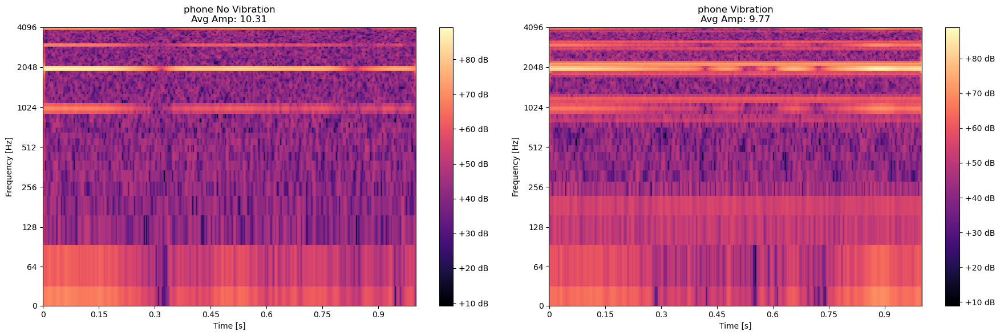

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from mmwave.dataloader import DCA1000

def process_radar_data(filepath, num_frames, num_chirps=1, num_rx=4, num_samples=256):
    """Process radar data and return flattened frames"""
    adc_data = np.fromfile(filepath, dtype=np.int16)
    
    adc_data_padded = np.ones(num_frames * num_rx * num_samples * num_chirps * 2) * 1E-8
    adc_data_padded[:adc_data.shape[0]] = adc_data        
    adc_data = adc_data_padded.reshape(num_frames, -1)
    
    adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=num_chirps,
                                    num_rx=num_rx, num_samples=num_samples)
    adc_data_sq = np.squeeze(adc_data)
    
    # Remove static clutter (mean across frames)
    adc_data_mean_removed = adc_data_sq - np.mean(adc_data_sq, axis=0, keepdims=True)
    adc_data_mean = np.mean(adc_data_mean_removed, axis=1)
    
    # Flatten the frames
    flattened_frames = adc_data_mean.flatten().astype(np.float32)
    flattened_frames = np.nan_to_num(flattened_frames, nan=0.0, posinf=0.0, neginf=0.0)
    
    return flattened_frames

# === Configuration ===
file1_path = "new data\\phone-no-vibration-256adc-1chirp-1000frames-1ms.bin"
file1_frames = 1000
file1_label = "phone No Vibration"

file2_path = "new data\\phone-vibration-256adc-1chirp-1000frames-1ms.bin"
file2_frames = 1000
file2_label = "phone Vibration"

# === Process both files ===
signal1 = process_radar_data(file1_path, file1_frames)
signal2 = process_radar_data(file2_path, file2_frames)

# === Parameters ===
Fs = 256 * 1000  # Sample rate
n_fft = 4096
hop_length = 512

# === Compute STFT for both ===
D1 = librosa.stft(signal1, n_fft=n_fft, hop_length=hop_length)
D2 = librosa.stft(signal2, n_fft=n_fft, hop_length=hop_length)

S_db1 = librosa.amplitude_to_db(np.abs(D1), ref=1.0)
S_db2 = librosa.amplitude_to_db(np.abs(D2), ref=1.0)

# === Calculate and print average amplitudes ===
avg_amplitude1 = np.mean(np.abs(signal1))
avg_amplitude2 = np.mean(np.abs(signal2))
rms_amplitude1 = np.sqrt(np.mean(signal1**2))
rms_amplitude2 = np.sqrt(np.mean(signal2**2))

print("=" * 50)
print("AMPLITUDE ANALYSIS")
print("=" * 50)
print(f"\n{file1_label}:")
print(f"  Average Amplitude: {avg_amplitude1:.4f}")
print(f"  RMS Amplitude: {rms_amplitude1:.4f}")
print(f"  Min: {signal1.min():.4f}, Max: {signal1.max():.4f}")

print(f"\n{file2_label}:")
print(f"  Average Amplitude: {avg_amplitude2:.4f}")
print(f"  RMS Amplitude: {rms_amplitude2:.4f}")
print(f"  Min: {signal2.min():.4f}, Max: {signal2.max():.4f}")

print(f"\nAmplitude Ratio (Vibration/No Vibration): {avg_amplitude2/avg_amplitude1:.2f}x")
print(f"RMS Ratio (Vibration/No Vibration): {rms_amplitude2/rms_amplitude1:.2f}x")
print("=" * 50)

# === Print spectrogram info ===
print(f"\nSpectrogram 1 dB range: {S_db1.min():.1f} to {S_db1.max():.1f}")
print(f"Spectrogram 2 dB range: {S_db2.min():.1f} to {S_db2.max():.1f}")

# === Plot spectrograms ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[0])
axes[0].set_title(f'{file1_label}\nAvg Amp: {avg_amplitude1:.2f}')
axes[0].set_ylim([0, 4096])
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[1])
axes[1].set_title(f'{file2_label}\nAvg Amp: {avg_amplitude2:.2f}')
axes[1].set_ylim([0, 4096])
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

C:\Users\melih\AppData\Local\Temp\ipykernel_16852\3923155938.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


AMPLITUDE ANALYSIS

pipe No Vibration:
  Average Amplitude: 5.7196
  RMS Amplitude: 7.1743
  Min: -33.8618, Max: 34.2475

pipe Vibration:
  Average Amplitude: 7.6807
  RMS Amplitude: 9.6381
  Min: -40.4062, Max: 41.6525

Amplitude Ratio (Vibration/No Vibration): 1.34x
RMS Ratio (Vibration/No Vibration): 1.34x

Spectrogram 1 dB range: -7.2 to 72.8
Spectrogram 2 dB range: 0.9 to 80.9


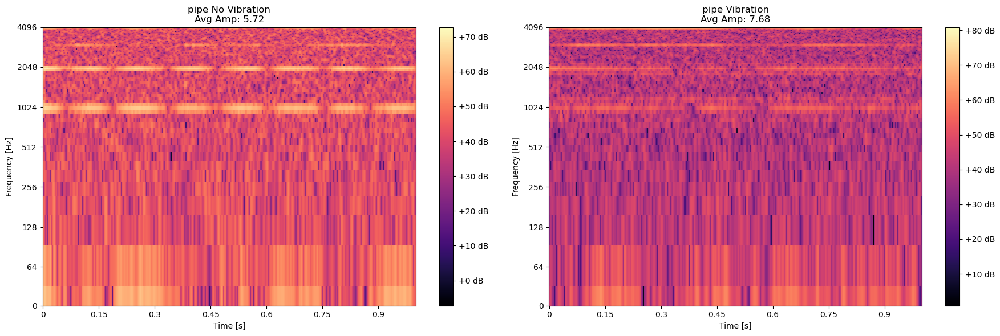

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from mmwave.dataloader import DCA1000

def process_radar_data(filepath, num_frames, num_chirps=1, num_rx=4, num_samples=256):
    """Process radar data and return flattened frames"""
    adc_data = np.fromfile(filepath, dtype=np.int16)
    
    adc_data_padded = np.ones(num_frames * num_rx * num_samples * num_chirps * 2) * 1E-8
    adc_data_padded[:adc_data.shape[0]] = adc_data        
    adc_data = adc_data_padded.reshape(num_frames, -1)
    
    adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=num_chirps,
                                    num_rx=num_rx, num_samples=num_samples)
    adc_data_sq = np.squeeze(adc_data)
    
    # Remove static clutter (mean across frames)
    adc_data_mean_removed = adc_data_sq - np.mean(adc_data_sq, axis=0, keepdims=True)
    adc_data_mean = np.mean(adc_data_mean_removed, axis=1)
    
    # Flatten the frames
    flattened_frames = adc_data_mean.flatten().astype(np.float32)
    flattened_frames = np.nan_to_num(flattened_frames, nan=0.0, posinf=0.0, neginf=0.0)
    
    return flattened_frames

# === Configuration ===
file1_path = "new data\\pipe-no-vibration-256adc-1chirp-1000frames-1ms.bin"
file1_frames = 1000
file1_label = "pipe No Vibration"

file2_path = "new data\\pipe-vibration-256adc-1chirp-1000frames-1ms.bin"
file2_frames = 1000
file2_label = "pipe Vibration"

# === Process both files ===
signal1 = process_radar_data(file1_path, file1_frames)
signal2 = process_radar_data(file2_path, file2_frames)

# === Parameters ===
Fs = 256 * 1000  # Sample rate
n_fft = 4096
hop_length = 512

# === Compute STFT for both ===
D1 = librosa.stft(signal1, n_fft=n_fft, hop_length=hop_length)
D2 = librosa.stft(signal2, n_fft=n_fft, hop_length=hop_length)

S_db1 = librosa.amplitude_to_db(np.abs(D1), ref=1.0)
S_db2 = librosa.amplitude_to_db(np.abs(D2), ref=1.0)

# === Calculate and print average amplitudes ===
avg_amplitude1 = np.mean(np.abs(signal1))
avg_amplitude2 = np.mean(np.abs(signal2))
rms_amplitude1 = np.sqrt(np.mean(signal1**2))
rms_amplitude2 = np.sqrt(np.mean(signal2**2))

print("=" * 50)
print("AMPLITUDE ANALYSIS")
print("=" * 50)
print(f"\n{file1_label}:")
print(f"  Average Amplitude: {avg_amplitude1:.4f}")
print(f"  RMS Amplitude: {rms_amplitude1:.4f}")
print(f"  Min: {signal1.min():.4f}, Max: {signal1.max():.4f}")

print(f"\n{file2_label}:")
print(f"  Average Amplitude: {avg_amplitude2:.4f}")
print(f"  RMS Amplitude: {rms_amplitude2:.4f}")
print(f"  Min: {signal2.min():.4f}, Max: {signal2.max():.4f}")

print(f"\nAmplitude Ratio (Vibration/No Vibration): {avg_amplitude2/avg_amplitude1:.2f}x")
print(f"RMS Ratio (Vibration/No Vibration): {rms_amplitude2/rms_amplitude1:.2f}x")
print("=" * 50)

# === Print spectrogram info ===
print(f"\nSpectrogram 1 dB range: {S_db1.min():.1f} to {S_db1.max():.1f}")
print(f"Spectrogram 2 dB range: {S_db2.min():.1f} to {S_db2.max():.1f}")

# === Plot spectrograms ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[0])
axes[0].set_title(f'{file1_label}\nAvg Amp: {avg_amplitude1:.2f}')
axes[0].set_ylim([0, 4096])
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[1])
axes[1].set_title(f'{file2_label}\nAvg Amp: {avg_amplitude2:.2f}')
axes[1].set_ylim([0, 4096])
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

C:\Users\melih\AppData\Local\Temp\ipykernel_16852\155285171.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


Signal 1 - min: -33.86, max: 34.25
Signal 2 - min: -40.41, max: 41.65
Spectrogram 1 dB range: -7.2 to 72.8
Spectrogram 2 dB range: 0.9 to 80.9


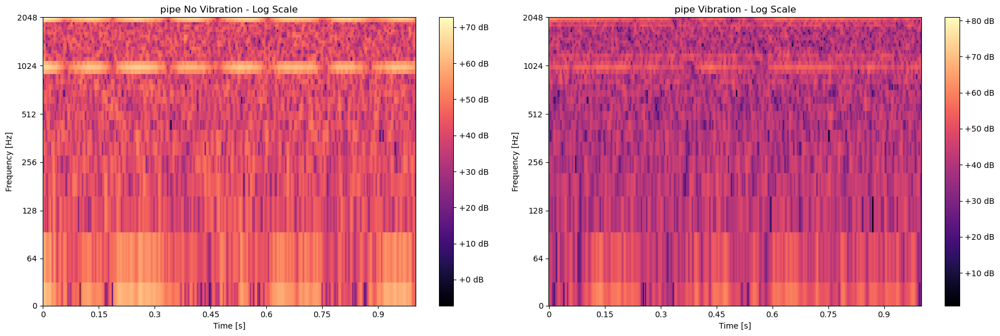

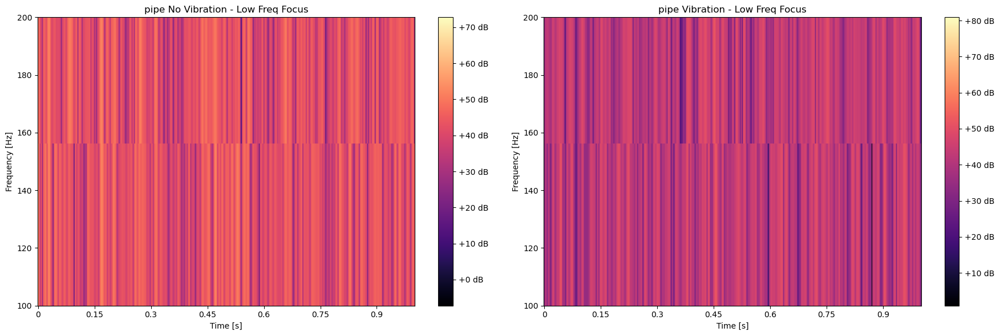

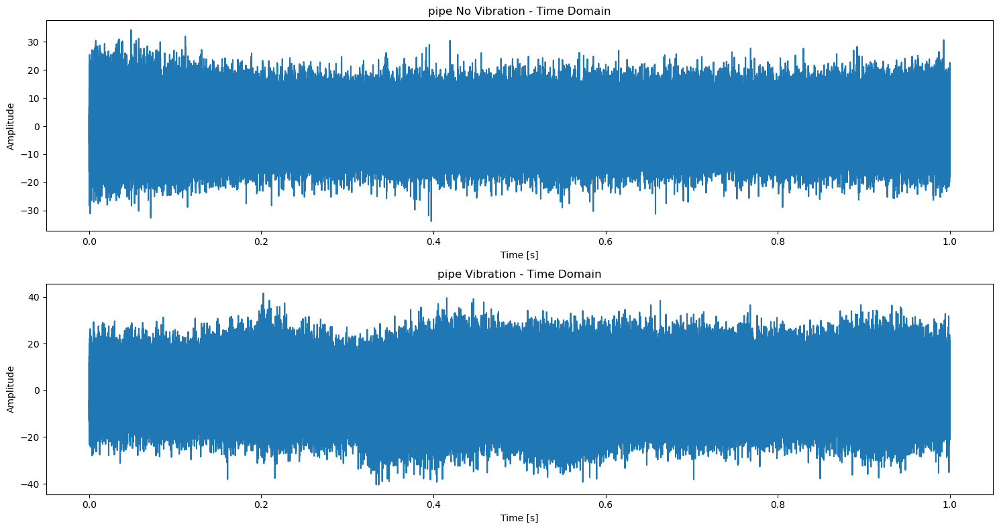

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from mmwave.dataloader import DCA1000

def process_radar_data(filepath, num_frames, num_chirps=1, num_rx=4, num_samples=256):
    """Process radar data and return flattened frames"""
    adc_data = np.fromfile(filepath, dtype=np.int16)
    
    adc_data_padded = np.ones(num_frames * num_rx * num_samples * num_chirps * 2) * 1E-8
    adc_data_padded[:adc_data.shape[0]] = adc_data        
    adc_data = adc_data_padded.reshape(num_frames, -1)
    
    adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=num_chirps,
                                    num_rx=num_rx, num_samples=num_samples)
    adc_data_sq = np.squeeze(adc_data)
    
    # Remove static clutter (mean across frames)
    adc_data_mean_removed = adc_data_sq - np.mean(adc_data_sq, axis=0, keepdims=True)
    adc_data_mean = np.mean(adc_data_mean_removed, axis=1)
    
    # Flatten the frames
    flattened_frames = adc_data_mean.flatten().astype(np.float32)
    flattened_frames = np.nan_to_num(flattened_frames, nan=0.0, posinf=0.0, neginf=0.0)
    
    return flattened_frames

# === Configuration ===
# File 1 - Change these to your actual files
file1_path = "new data\\pipe-no-vibration-256adc-1chirp-1000frames-1ms.bin"
file1_frames = 1000
file1_label = "pipe No Vibration"

# File 2 - Change these to your actual files
file2_path = "new data\\pipe-vibration-256adc-1chirp-1000frames-1ms.bin"  # Change to your second file
file2_frames = 1000
file2_label = "pipe Vibration"

# === Process both files ===
signal1 = process_radar_data(file1_path, file1_frames)
signal2 = process_radar_data(file2_path, file2_frames)

# === Parameters ===
Fs = 256 * 1000  # Sample rate
n_fft = 4096
hop_length = 512

# === Compute STFT for both ===
D1 = librosa.stft(signal1, n_fft=n_fft, hop_length=hop_length)
D2 = librosa.stft(signal2, n_fft=n_fft, hop_length=hop_length)

S_db1 = librosa.amplitude_to_db(np.abs(D1), ref=1.0)
S_db2 = librosa.amplitude_to_db(np.abs(D2), ref=1.0)

# === Print info ===
print(f"Signal 1 - min: {signal1.min():.2f}, max: {signal1.max():.2f}")
print(f"Signal 2 - min: {signal2.min():.2f}, max: {signal2.max():.2f}")
print(f"Spectrogram 1 dB range: {S_db1.min():.1f} to {S_db1.max():.1f}")
print(f"Spectrogram 2 dB range: {S_db2.min():.1f} to {S_db2.max():.1f}")

# === Plot 1: Side-by-side spectrograms (Log scale) ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[0])
axes[0].set_title(f'{file1_label} - Log Scale')
axes[0].set_ylim([0, 2048])
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[1])
axes[1].set_title(f'{file2_label} - Log Scale')
axes[1].set_ylim([0, 2048])
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

# === Plot 2: Side-by-side spectrograms (Linear scale, low frequency focus) ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='linear', ax=axes[0])
axes[0].set_ylim([100, 200])
axes[0].set_title(f'{file1_label} - Low Freq Focus')
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='linear', ax=axes[1])
axes[1].set_ylim([100, 200])
axes[1].set_title(f'{file2_label} - Low Freq Focus')
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

# === Plot 3: Time-domain signals comparison ===
fig, axes = plt.subplots(2, 1, figsize=(15, 8))

time1 = np.arange(len(signal1)) / Fs
time2 = np.arange(len(signal2)) / Fs

axes[0].plot(time1, signal1)
axes[0].set_title(f'{file1_label} - Time Domain')
axes[0].set_xlabel('Time [s]')
axes[0].set_ylabel('Amplitude')

axes[1].plot(time2, signal2)
axes[1].set_title(f'{file2_label} - Time Domain')
axes[1].set_xlabel('Time [s]')
axes[1].set_ylabel('Amplitude')

plt.tight_layout()
plt.show()

C:\Users\melih\AppData\Local\Temp\ipykernel_17040\3008913014.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


Signal 1 - min: -145.26, max: 69.37
Signal 2 - min: -418.21, max: 452.35
Spectrogram 1 dB range: -1.9 to 78.1
Spectrogram 2 dB range: 27.4 to 107.4


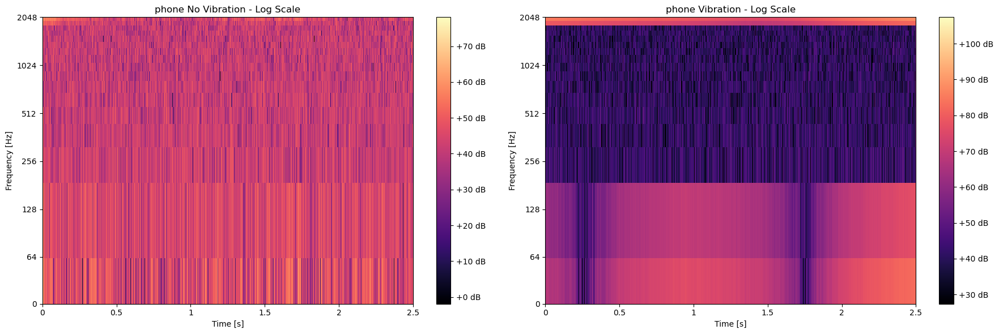

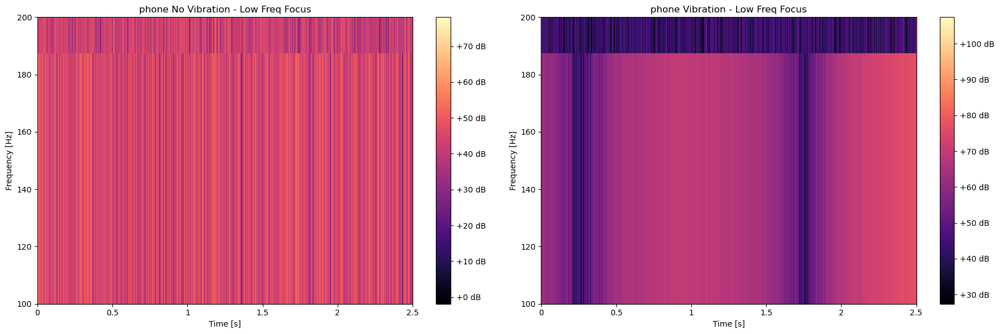

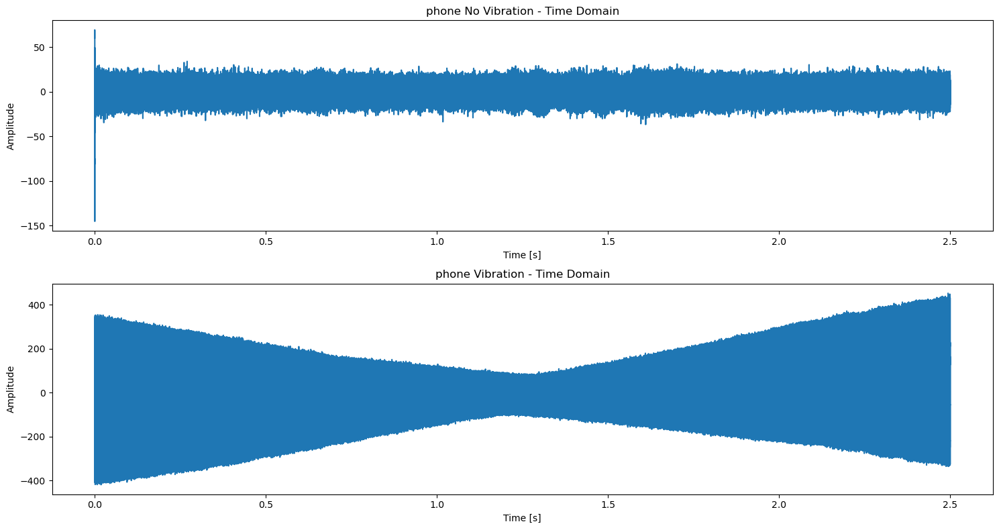

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from mmwave.dataloader import DCA1000

def process_radar_data(filepath, num_frames, num_chirps=1, num_rx=4, num_samples=256):
    """Process radar data and return flattened frames"""
    adc_data = np.fromfile(filepath, dtype=np.int16)
    
    adc_data_padded = np.ones(num_frames * num_rx * num_samples * num_chirps * 2) * 1E-8
    adc_data_padded[:adc_data.shape[0]] = adc_data        
    adc_data = adc_data_padded.reshape(num_frames, -1)
    
    adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=num_chirps,
                                    num_rx=num_rx, num_samples=num_samples)
    adc_data_sq = np.squeeze(adc_data)
    
    # Remove static clutter (mean across frames)
    adc_data_mean_removed = adc_data_sq - np.mean(adc_data_sq, axis=0, keepdims=True)
    adc_data_mean = np.mean(adc_data_mean_removed, axis=1)
    
    # Flatten the frames
    flattened_frames = adc_data_mean.flatten().astype(np.float32)
    flattened_frames = np.nan_to_num(flattened_frames, nan=0.0, posinf=0.0, neginf=0.0)
    
    return flattened_frames

# === Configuration ===
# File 1 - Change these to your actual files
file1_path = "new data\\phone-no-vibration-adc256-chirp1-sample5000-0.5ms.bin"
file1_frames = 5000
file1_label = "phone No Vibration"

# File 2 - Change these to your actual files
file2_path = "new data\\phone-vibration-adc256-chirp1-sample5000-0.5ms.bin"  # Change to your second file
file2_frames = 5000
file2_label = "phone Vibration"

# === Process both files ===
signal1 = process_radar_data(file1_path, file1_frames)
signal2 = process_radar_data(file2_path, file2_frames)

# === Parameters ===
Fs = 256 * 2000  # Sample rate
n_fft = 4096
hop_length = 512

# === Compute STFT for both ===
D1 = librosa.stft(signal1, n_fft=n_fft, hop_length=hop_length)
D2 = librosa.stft(signal2, n_fft=n_fft, hop_length=hop_length)

S_db1 = librosa.amplitude_to_db(np.abs(D1), ref=1.0)
S_db2 = librosa.amplitude_to_db(np.abs(D2), ref=1.0)

# === Print info ===
print(f"Signal 1 - min: {signal1.min():.2f}, max: {signal1.max():.2f}")
print(f"Signal 2 - min: {signal2.min():.2f}, max: {signal2.max():.2f}")
print(f"Spectrogram 1 dB range: {S_db1.min():.1f} to {S_db1.max():.1f}")
print(f"Spectrogram 2 dB range: {S_db2.min():.1f} to {S_db2.max():.1f}")

# === Plot 1: Side-by-side spectrograms (Log scale) ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[0])
axes[0].set_title(f'{file1_label} - Log Scale')
axes[0].set_ylim([0, 2048])
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[1])
axes[1].set_title(f'{file2_label} - Log Scale')
axes[1].set_ylim([0, 2048])
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

# === Plot 2: Side-by-side spectrograms (Linear scale, low frequency focus) ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='linear', ax=axes[0])
axes[0].set_ylim([100, 200])
axes[0].set_title(f'{file1_label} - Low Freq Focus')
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='linear', ax=axes[1])
axes[1].set_ylim([100, 200])
axes[1].set_title(f'{file2_label} - Low Freq Focus')
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

# === Plot 3: Time-domain signals comparison ===
fig, axes = plt.subplots(2, 1, figsize=(15, 8))

time1 = np.arange(len(signal1)) / Fs
time2 = np.arange(len(signal2)) / Fs

axes[0].plot(time1, signal1)
axes[0].set_title(f'{file1_label} - Time Domain')
axes[0].set_xlabel('Time [s]')
axes[0].set_ylabel('Amplitude')

axes[1].plot(time2, signal2)
axes[1].set_title(f'{file2_label} - Time Domain')
axes[1].set_xlabel('Time [s]')
axes[1].set_ylabel('Amplitude')

plt.tight_layout()
plt.show()

(5000, 256)
(1280000,)
(2049, 2501)


C:\Users\melih\AppData\Local\Temp\ipykernel_17040\3013430852.py:23: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


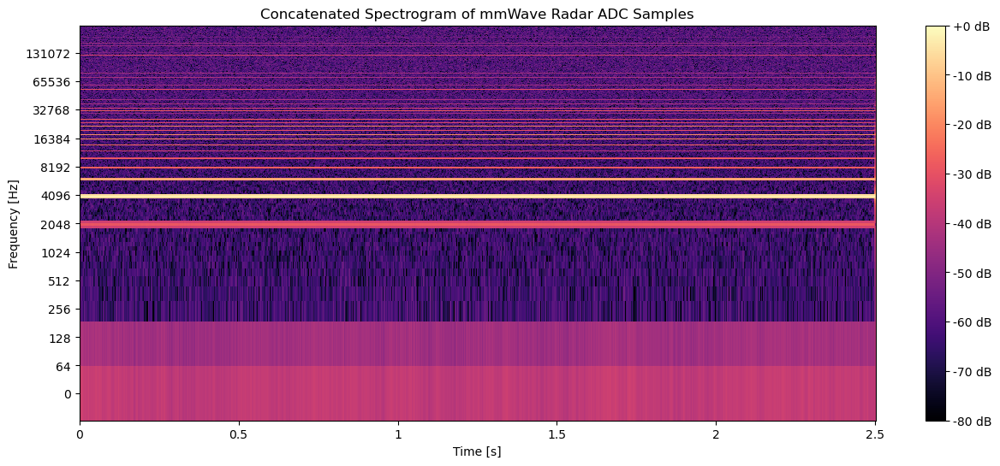

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("new data\\phone-no-vibration-adc256-chirp1-sample5000-0.5ms.bin", dtype=np.int16)

adc_data_padded = np.ones(5000*4*256*1*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(5000, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                num_rx=4, num_samples=256)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 2000  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


(5000, 256)
(1280000,)


C:\Users\melih\AppData\Local\Temp\ipykernel_17040\3550919893.py:23: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


(2049, 2501)


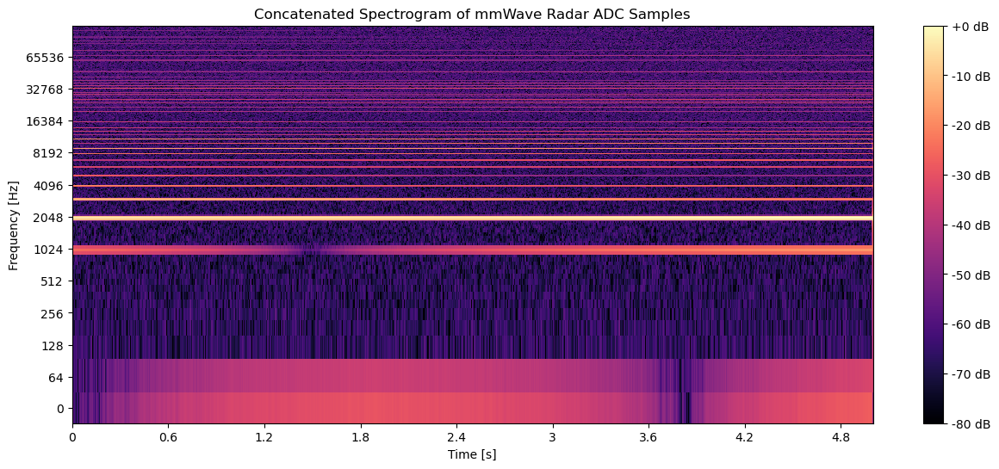

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("new data\\phone-vibration-adc256-chirp1-sample5000-0.5ms.bin", dtype=np.int16)

adc_data_padded = np.ones(5000*4*256*1*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(5000, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                num_rx=4, num_samples=256)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 1000  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


C:\Users\melih\AppData\Local\Temp\ipykernel_17040\3131490248.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


AMPLITUDE ANALYSIS

phone No Vibration:
  Average Amplitude: 5.4459
  RMS Amplitude: 6.8551
  Min: -145.2645, Max: 69.3730

phone Vibration:
  Average Amplitude: 83.9024
  RMS Amplitude: 108.9546
  Min: -418.2098, Max: 452.3489

Amplitude Ratio (Vibration/No Vibration): 15.41x
RMS Ratio (Vibration/No Vibration): 15.89x

Spectrogram 1 dB range: -1.9 to 78.1
Spectrogram 2 dB range: 27.4 to 107.4


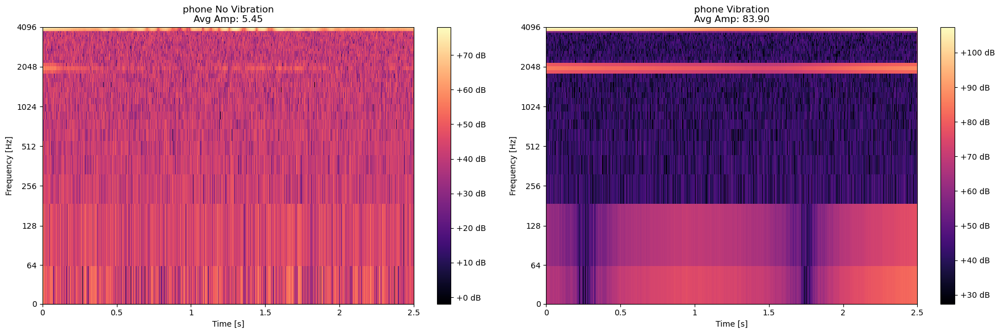

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from mmwave.dataloader import DCA1000

def process_radar_data(filepath, num_frames, num_chirps=1, num_rx=4, num_samples=256):
    """Process radar data and return flattened frames"""
    adc_data = np.fromfile(filepath, dtype=np.int16)
    
    adc_data_padded = np.ones(num_frames * num_rx * num_samples * num_chirps * 2) * 1E-8
    adc_data_padded[:adc_data.shape[0]] = adc_data        
    adc_data = adc_data_padded.reshape(num_frames, -1)
    
    adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=num_chirps,
                                    num_rx=num_rx, num_samples=num_samples)
    adc_data_sq = np.squeeze(adc_data)
    
    # Remove static clutter (mean across frames)
    adc_data_mean_removed = adc_data_sq - np.mean(adc_data_sq, axis=0, keepdims=True)
    adc_data_mean = np.mean(adc_data_mean_removed, axis=1)
    
    # Flatten the frames
    flattened_frames = adc_data_mean.flatten().astype(np.float32)
    flattened_frames = np.nan_to_num(flattened_frames, nan=0.0, posinf=0.0, neginf=0.0)
    
    return flattened_frames

# === Configuration ===
file1_path = "new data\\phone-no-vibration-adc256-chirp1-sample5000-0.5ms.bin"
file1_frames = 5000
file1_label = "phone No Vibration"

file2_path = "new data\\phone-vibration-adc256-chirp1-sample5000-0.5ms.bin"
file2_frames = 5000
file2_label = "phone Vibration"

# === Process both files ===
signal1 = process_radar_data(file1_path, file1_frames)
signal2 = process_radar_data(file2_path, file2_frames)

# === Parameters ===
Fs = 256 * 2000  # Sample rate
n_fft = 4096
hop_length = 512

# === Compute STFT for both ===
D1 = librosa.stft(signal1, n_fft=n_fft, hop_length=hop_length)
D2 = librosa.stft(signal2, n_fft=n_fft, hop_length=hop_length)

S_db1 = librosa.amplitude_to_db(np.abs(D1), ref=1.0)
S_db2 = librosa.amplitude_to_db(np.abs(D2), ref=1.0)

# === Calculate and print average amplitudes ===
avg_amplitude1 = np.mean(np.abs(signal1))
avg_amplitude2 = np.mean(np.abs(signal2))
rms_amplitude1 = np.sqrt(np.mean(signal1**2))
rms_amplitude2 = np.sqrt(np.mean(signal2**2))

print("=" * 50)
print("AMPLITUDE ANALYSIS")
print("=" * 50)
print(f"\n{file1_label}:")
print(f"  Average Amplitude: {avg_amplitude1:.4f}")
print(f"  RMS Amplitude: {rms_amplitude1:.4f}")
print(f"  Min: {signal1.min():.4f}, Max: {signal1.max():.4f}")

print(f"\n{file2_label}:")
print(f"  Average Amplitude: {avg_amplitude2:.4f}")
print(f"  RMS Amplitude: {rms_amplitude2:.4f}")
print(f"  Min: {signal2.min():.4f}, Max: {signal2.max():.4f}")

print(f"\nAmplitude Ratio (Vibration/No Vibration): {avg_amplitude2/avg_amplitude1:.2f}x")
print(f"RMS Ratio (Vibration/No Vibration): {rms_amplitude2/rms_amplitude1:.2f}x")
print("=" * 50)

# === Print spectrogram info ===
print(f"\nSpectrogram 1 dB range: {S_db1.min():.1f} to {S_db1.max():.1f}")
print(f"Spectrogram 2 dB range: {S_db2.min():.1f} to {S_db2.max():.1f}")

# === Plot spectrograms ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[0])
axes[0].set_title(f'{file1_label}\nAvg Amp: {avg_amplitude1:.2f}')
axes[0].set_ylim([0, 4096])
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[1])
axes[1].set_title(f'{file2_label}\nAvg Amp: {avg_amplitude2:.2f}')
axes[1].set_ylim([0, 4096])
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

C:\Users\melih\AppData\Local\Temp\ipykernel_17040\561288721.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


Signal 1 - min: -29.25, max: 30.01
Signal 2 - min: -191.60, max: 184.97
Spectrogram 1 dB range: -7.8 to 72.2
Spectrogram 2 dB range: 14.5 to 94.5


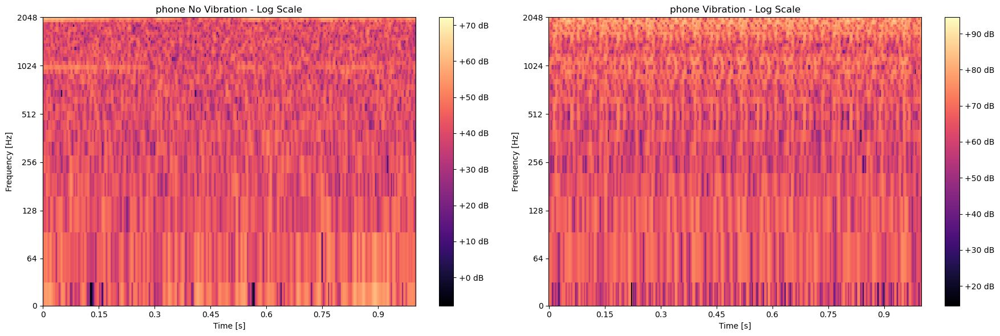

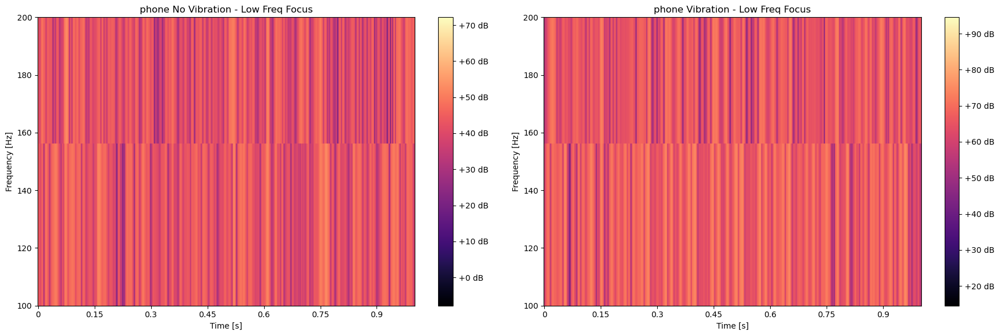

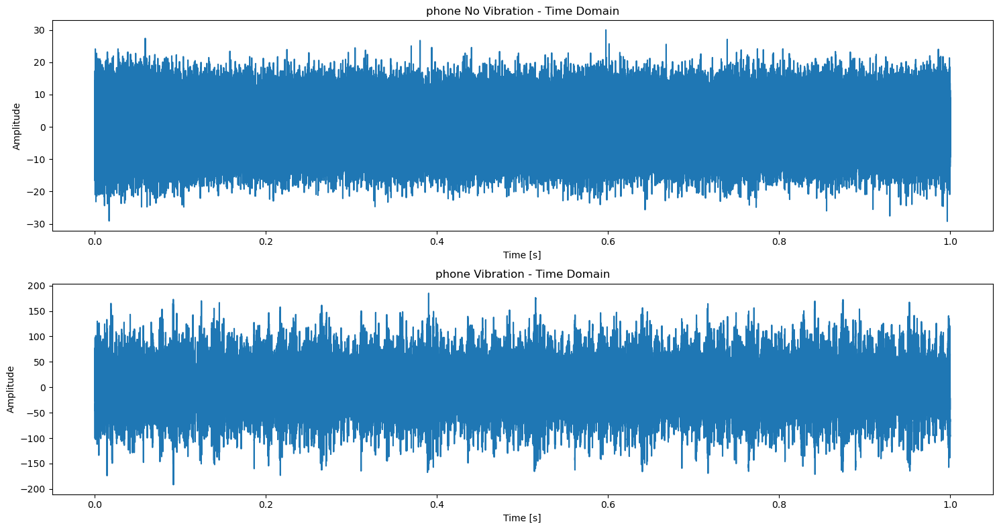

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from mmwave.dataloader import DCA1000

def process_radar_data(filepath, num_frames, num_chirps=1, num_rx=4, num_samples=256):
    """Process radar data and return flattened frames"""
    adc_data = np.fromfile(filepath, dtype=np.int16)
    
    adc_data_padded = np.ones(num_frames * num_rx * num_samples * num_chirps * 2) * 1E-8
    adc_data_padded[:adc_data.shape[0]] = adc_data        
    adc_data = adc_data_padded.reshape(num_frames, -1)
    
    adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=num_chirps,
                                    num_rx=num_rx, num_samples=num_samples)
    adc_data_sq = np.squeeze(adc_data)
    
    # Remove static clutter (mean across frames)
    adc_data_mean_removed = adc_data_sq - np.mean(adc_data_sq, axis=0, keepdims=True)
    adc_data_mean = np.mean(adc_data_mean_removed, axis=1)
    
    # Flatten the frames
    flattened_frames = adc_data_mean.flatten().astype(np.float32)
    flattened_frames = np.nan_to_num(flattened_frames, nan=0.0, posinf=0.0, neginf=0.0)
    
    return flattened_frames

# === Configuration ===
# File 1 - Change these to your actual files
file1_path = "new data\\vantilator-no-vibration-256adc-1chirp-1000frames-1ms.bin"
file1_frames = 1000
file1_label = "phone No Vibration"

# File 2 - Change these to your actual files
file2_path = "new data\\vantilator-vibration-256adc-1chirp-1000frames-1ms.bin"  # Change to your second file
file2_frames = 1000
file2_label = "phone Vibration"

# === Process both files ===
signal1 = process_radar_data(file1_path, file1_frames)
signal2 = process_radar_data(file2_path, file2_frames)

# === Parameters ===
Fs = 256 * 1000  # Sample rate
n_fft = 4096
hop_length = 512

# === Compute STFT for both ===
D1 = librosa.stft(signal1, n_fft=n_fft, hop_length=hop_length)
D2 = librosa.stft(signal2, n_fft=n_fft, hop_length=hop_length)

S_db1 = librosa.amplitude_to_db(np.abs(D1), ref=1.0)
S_db2 = librosa.amplitude_to_db(np.abs(D2), ref=1.0)

# === Print info ===
print(f"Signal 1 - min: {signal1.min():.2f}, max: {signal1.max():.2f}")
print(f"Signal 2 - min: {signal2.min():.2f}, max: {signal2.max():.2f}")
print(f"Spectrogram 1 dB range: {S_db1.min():.1f} to {S_db1.max():.1f}")
print(f"Spectrogram 2 dB range: {S_db2.min():.1f} to {S_db2.max():.1f}")

# === Plot 1: Side-by-side spectrograms (Log scale) ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[0])
axes[0].set_title(f'{file1_label} - Log Scale')
axes[0].set_ylim([0, 2048])
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[1])
axes[1].set_title(f'{file2_label} - Log Scale')
axes[1].set_ylim([0, 2048])
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

# === Plot 2: Side-by-side spectrograms (Linear scale, low frequency focus) ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='linear', ax=axes[0])
axes[0].set_ylim([100, 200])
axes[0].set_title(f'{file1_label} - Low Freq Focus')
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='linear', ax=axes[1])
axes[1].set_ylim([100, 200])
axes[1].set_title(f'{file2_label} - Low Freq Focus')
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

# === Plot 3: Time-domain signals comparison ===
fig, axes = plt.subplots(2, 1, figsize=(15, 8))

time1 = np.arange(len(signal1)) / Fs
time2 = np.arange(len(signal2)) / Fs

axes[0].plot(time1, signal1)
axes[0].set_title(f'{file1_label} - Time Domain')
axes[0].set_xlabel('Time [s]')
axes[0].set_ylabel('Amplitude')

axes[1].plot(time2, signal2)
axes[1].set_title(f'{file2_label} - Time Domain')
axes[1].set_xlabel('Time [s]')
axes[1].set_ylabel('Amplitude')

plt.tight_layout()
plt.show()

(250, 1, 4, 256)
(250, 256)
(64000,)
(4097, 126)


C:\Users\melih\AppData\Local\Temp\ipykernel_17040\1979306072.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


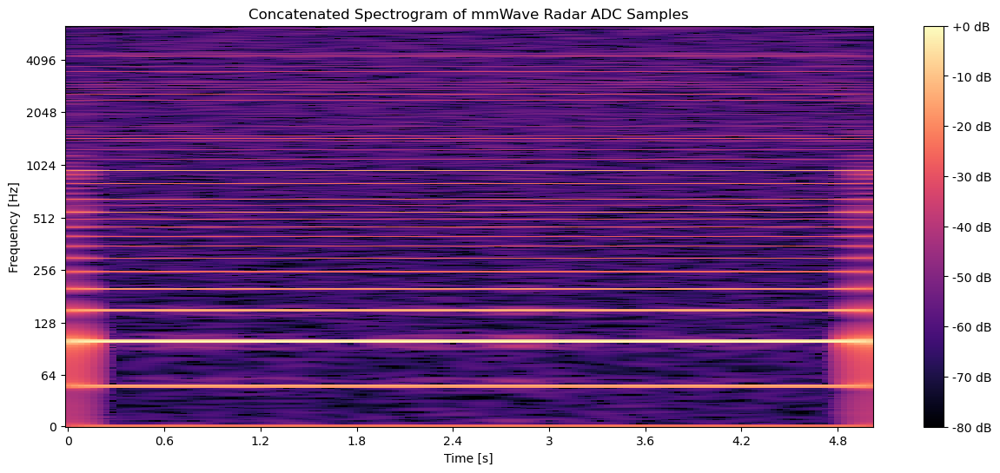

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("new data\\phone-no-vibration-adc256-chirp1-frame250-20ms.bin", dtype=np.int16)

adc_data_padded = np.ones(250*4*256*1*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(250, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                num_rx=4, num_samples=256)

adc_data = np.mean(adc_data, axis=1, keepdims=True)
print(adc_data.shape)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 50  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 * 2 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()



(250, 1, 4, 256)
(250, 256)
(64000,)
(4097, 126)


C:\Users\melih\AppData\Local\Temp\ipykernel_17040\1586052572.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


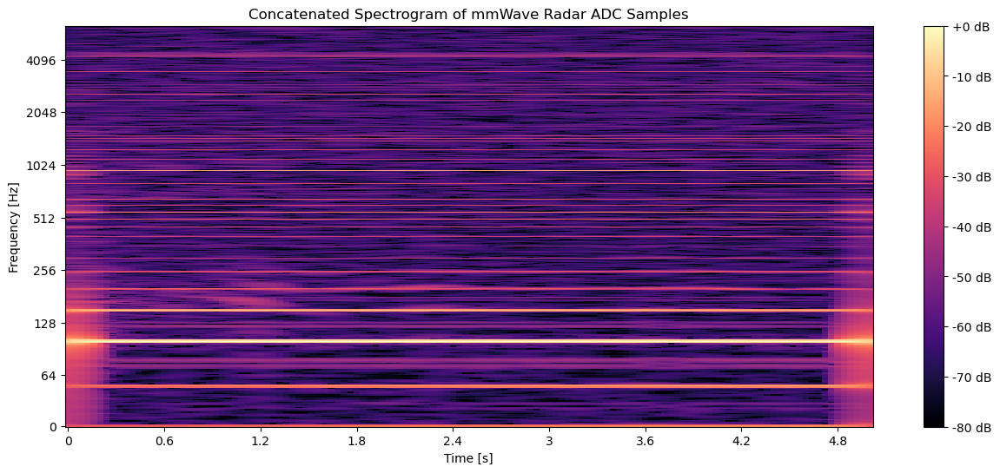

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("new data\\phone-vibration-adc256-chirp1-frame250-20ms.bin", dtype=np.int16)

adc_data_padded = np.ones(250*4*256*1*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(250, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=1,
                                num_rx=4, num_samples=256)

adc_data = np.mean(adc_data, axis=1, keepdims=True)
print(adc_data.shape)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 50  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 * 2 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


C:\Users\melih\AppData\Local\Temp\ipykernel_17040\1134693008.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


Signal 1 - min: -26.86, max: 27.30
Signal 2 - min: -26.86, max: 27.30
Spectrogram 1 dB range: -11.3 to 68.7
Spectrogram 2 dB range: -11.3 to 68.7


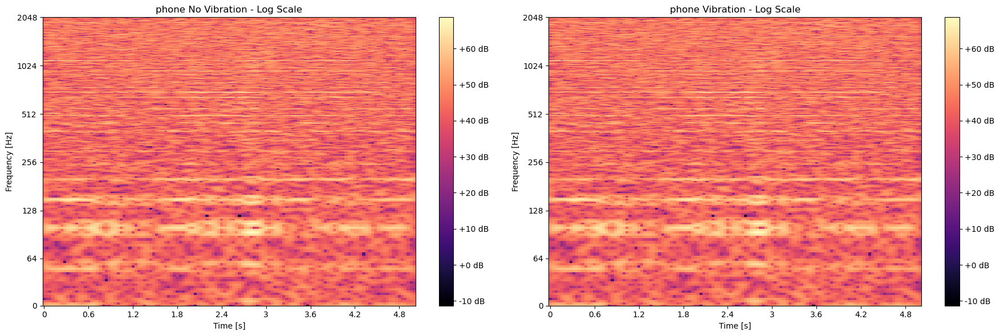

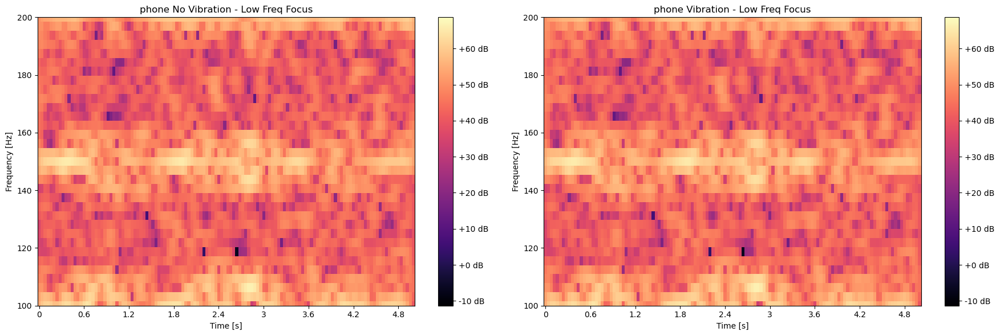

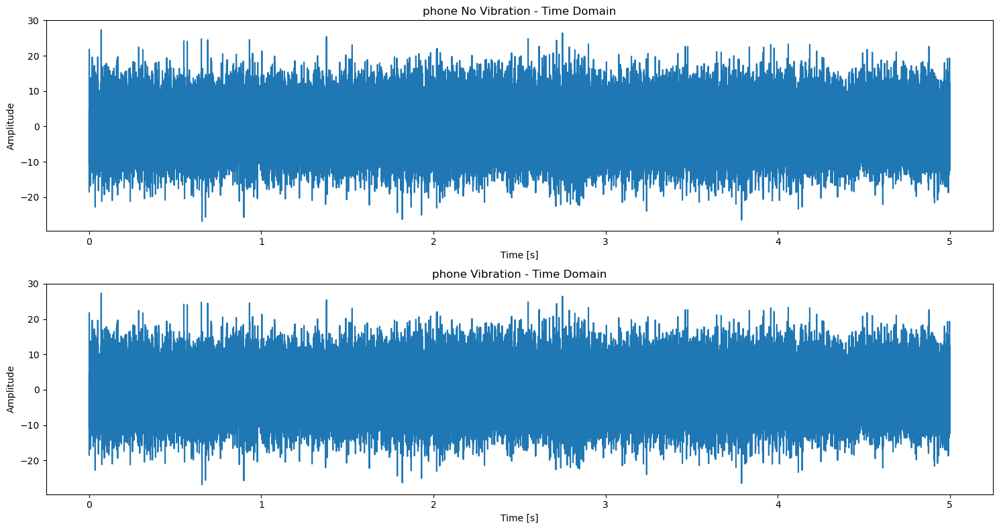

In [26]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from mmwave.dataloader import DCA1000

def process_radar_data(filepath, num_frames, num_chirps=1, num_rx=4, num_samples=256):
    """Process radar data and return flattened frames"""
    adc_data = np.fromfile(filepath, dtype=np.int16)
    
    adc_data_padded = np.ones(num_frames * num_rx * num_samples * num_chirps * 2) * 1E-8
    adc_data_padded[:adc_data.shape[0]] = adc_data        
    adc_data = adc_data_padded.reshape(num_frames, -1)
    
    adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=num_chirps,
                                    num_rx=num_rx, num_samples=num_samples)
    adc_data_sq = np.squeeze(adc_data)
    
    # Remove static clutter (mean across frames)
    adc_data_mean_removed = adc_data_sq - np.mean(adc_data_sq, axis=0, keepdims=True)
    adc_data_mean = np.mean(adc_data_mean_removed, axis=1)
    
    # Flatten the frames
    flattened_frames = adc_data_mean.flatten().astype(np.float32)
    flattened_frames = np.nan_to_num(flattened_frames, nan=0.0, posinf=0.0, neginf=0.0)
    
    return flattened_frames

# === Configuration ===
# File 1 - Change these to your actual files
file1_path = "new data\\phone-no-vibration-adc256-chirp1-frame250-20ms.bin"
file1_frames = 250
file1_label = "phone No Vibration"

# File 2 - Change these to your actual files
file2_path = "new data\\phone-no-vibration-adc256-chirp1-frame250-20ms.bin"  # Change to your second file
file2_frames = 250
file2_label = "phone Vibration"

# === Process both files ===
signal1 = process_radar_data(file1_path, file1_frames)
signal2 = process_radar_data(file2_path, file2_frames)

# === Parameters ===
Fs = 256 * 50  # Sample rate
n_fft = 4096
hop_length = 512

# === Compute STFT for both ===
D1 = librosa.stft(signal1, n_fft=n_fft, hop_length=hop_length)
D2 = librosa.stft(signal2, n_fft=n_fft, hop_length=hop_length)

S_db1 = librosa.amplitude_to_db(np.abs(D1), ref=1.0)
S_db2 = librosa.amplitude_to_db(np.abs(D2), ref=1.0)

# === Print info ===
print(f"Signal 1 - min: {signal1.min():.2f}, max: {signal1.max():.2f}")
print(f"Signal 2 - min: {signal2.min():.2f}, max: {signal2.max():.2f}")
print(f"Spectrogram 1 dB range: {S_db1.min():.1f} to {S_db1.max():.1f}")
print(f"Spectrogram 2 dB range: {S_db2.min():.1f} to {S_db2.max():.1f}")

# === Plot 1: Side-by-side spectrograms (Log scale) ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[0])
axes[0].set_title(f'{file1_label} - Log Scale')
axes[0].set_ylim([0, 2048])
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[1])
axes[1].set_title(f'{file2_label} - Log Scale')
axes[1].set_ylim([0, 2048])
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

# === Plot 2: Side-by-side spectrograms (Linear scale, low frequency focus) ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='linear', ax=axes[0])
axes[0].set_ylim([100, 200])
axes[0].set_title(f'{file1_label} - Low Freq Focus')
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='linear', ax=axes[1])
axes[1].set_ylim([100, 200])
axes[1].set_title(f'{file2_label} - Low Freq Focus')
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

# === Plot 3: Time-domain signals comparison ===
fig, axes = plt.subplots(2, 1, figsize=(15, 8))

time1 = np.arange(len(signal1)) / Fs
time2 = np.arange(len(signal2)) / Fs

axes[0].plot(time1, signal1)
axes[0].set_title(f'{file1_label} - Time Domain')
axes[0].set_xlabel('Time [s]')
axes[0].set_ylabel('Amplitude')

axes[1].plot(time2, signal2)
axes[1].set_title(f'{file2_label} - Time Domain')
axes[1].set_xlabel('Time [s]')
axes[1].set_ylabel('Amplitude')

plt.tight_layout()
plt.show()

C:\Users\melih\AppData\Local\Temp\ipykernel_17040\277212180.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


Signal 1 - min: -147.55, max: 75.94
Signal 2 - min: -122.02, max: 54.48
Spectrogram 1 dB range: -0.3 to 79.7
Spectrogram 2 dB range: -7.2 to 72.8


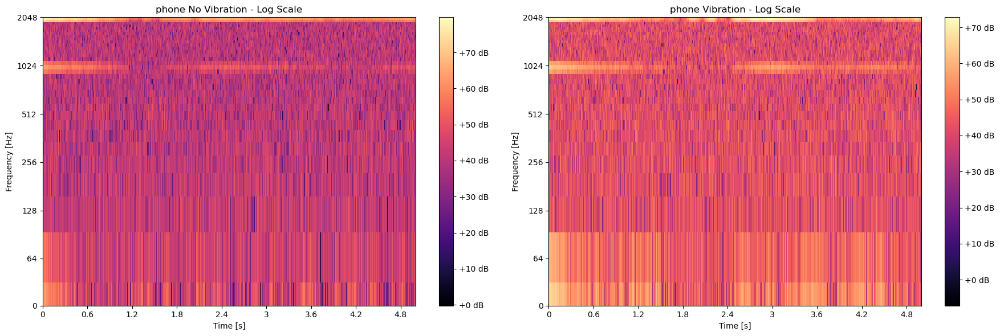

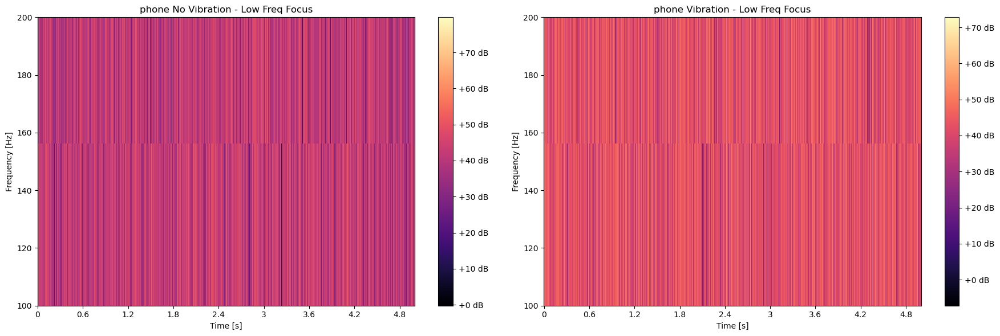

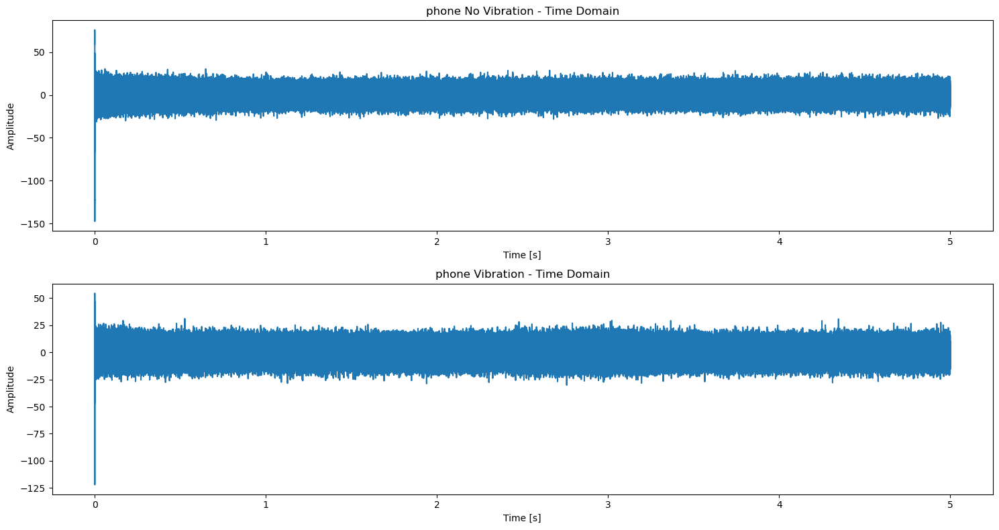

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from mmwave.dataloader import DCA1000

def process_radar_data(filepath, num_frames, num_chirps=1, num_rx=4, num_samples=256):
    """Process radar data and return flattened frames"""
    adc_data = np.fromfile(filepath, dtype=np.int16)
    
    adc_data_padded = np.ones(num_frames * num_rx * num_samples * num_chirps * 2) * 1E-8
    adc_data_padded[:adc_data.shape[0]] = adc_data        
    adc_data = adc_data_padded.reshape(num_frames, -1)
    
    adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=num_chirps,
                                    num_rx=num_rx, num_samples=num_samples)
    adc_data_sq = np.squeeze(adc_data)
    
    # Remove static clutter (mean across frames)
    adc_data_mean_removed = adc_data_sq - np.mean(adc_data_sq, axis=0, keepdims=True)
    adc_data_mean = np.mean(adc_data_mean_removed, axis=1)
    
    # Flatten the frames
    flattened_frames = adc_data_mean.flatten().astype(np.float32)
    flattened_frames = np.nan_to_num(flattened_frames, nan=0.0, posinf=0.0, neginf=0.0)
    
    return flattened_frames

# === Configuration ===
# File 1 - Change these to your actual files
file1_path = "new data\\phone-no-vibration-adc256-chirp1-frame5000-0.5ms.bin"
file1_frames = 5000
file1_label = "phone No Vibration"

# File 2 - Change these to your actual files
file2_path = "new data\\phone-vibration-adc256-chirp1-frame5000-0.5ms.bin"  # Change to your second file
file2_frames = 5000
file2_label = "phone Vibration"

# === Process both files ===
signal1 = process_radar_data(file1_path, file1_frames)
signal2 = process_radar_data(file2_path, file2_frames)

# === Parameters ===
Fs = 256 * 1000  # Sample rate
n_fft = 4096
hop_length = 512

# === Compute STFT for both ===
D1 = librosa.stft(signal1, n_fft=n_fft, hop_length=hop_length)
D2 = librosa.stft(signal2, n_fft=n_fft, hop_length=hop_length)

S_db1 = librosa.amplitude_to_db(np.abs(D1), ref=1.0)
S_db2 = librosa.amplitude_to_db(np.abs(D2), ref=1.0)

# === Print info ===
print(f"Signal 1 - min: {signal1.min():.2f}, max: {signal1.max():.2f}")
print(f"Signal 2 - min: {signal2.min():.2f}, max: {signal2.max():.2f}")
print(f"Spectrogram 1 dB range: {S_db1.min():.1f} to {S_db1.max():.1f}")
print(f"Spectrogram 2 dB range: {S_db2.min():.1f} to {S_db2.max():.1f}")

# === Plot 1: Side-by-side spectrograms (Log scale) ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[0])
axes[0].set_title(f'{file1_label} - Log Scale')
axes[0].set_ylim([0, 2048])
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log', ax=axes[1])
axes[1].set_title(f'{file2_label} - Log Scale')
axes[1].set_ylim([0, 2048])
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

# === Plot 2: Side-by-side spectrograms (Linear scale, low frequency focus) ===
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

img1 = librosa.display.specshow(S_db1, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='linear', ax=axes[0])
axes[0].set_ylim([100, 200])
axes[0].set_title(f'{file1_label} - Low Freq Focus')
axes[0].set_ylabel('Frequency [Hz]')
axes[0].set_xlabel('Time [s]')
fig.colorbar(img1, ax=axes[0], format='%+2.0f dB')

img2 = librosa.display.specshow(S_db2, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='linear', ax=axes[1])
axes[1].set_ylim([100, 200])
axes[1].set_title(f'{file2_label} - Low Freq Focus')
axes[1].set_ylabel('Frequency [Hz]')
axes[1].set_xlabel('Time [s]')
fig.colorbar(img2, ax=axes[1], format='%+2.0f dB')

plt.tight_layout()
plt.show()

# === Plot 3: Time-domain signals comparison ===
fig, axes = plt.subplots(2, 1, figsize=(15, 8))

time1 = np.arange(len(signal1)) / Fs
time2 = np.arange(len(signal2)) / Fs

axes[0].plot(time1, signal1)
axes[0].set_title(f'{file1_label} - Time Domain')
axes[0].set_xlabel('Time [s]')
axes[0].set_ylabel('Amplitude')

axes[1].plot(time2, signal2)
axes[1].set_title(f'{file2_label} - Time Domain')
axes[1].set_xlabel('Time [s]')
axes[1].set_ylabel('Amplitude')

plt.tight_layout()
plt.show()

(1000, 10, 4)
(40000,)
(2049, 79)


C:\Users\melih\AppData\Local\Temp\ipykernel_4252\1562454433.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


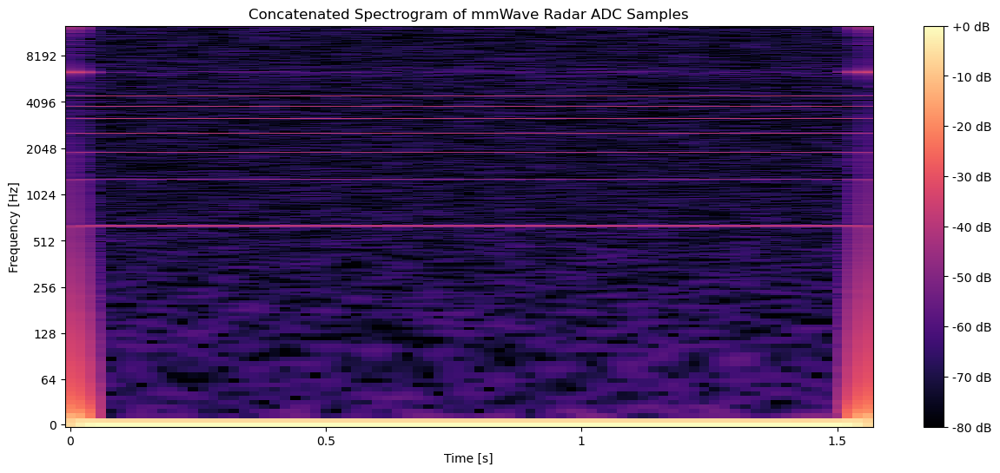

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("pipe-no-vibration-1000-10-256-10\\adc_data_0.bin", dtype=np.int16)

adc_data_padded = np.ones(1000*4*256*10*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(1000, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=10,
                                num_rx=4, num_samples=256)
#adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
adc_data_mean = np.mean(adc_data_sq, axis=3)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 100  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
#plt.ylim(1024,5000)
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


(1000, 10, 4)
(40000,)
(2049, 79)


C:\Users\melih\AppData\Local\Temp\ipykernel_4252\75475803.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


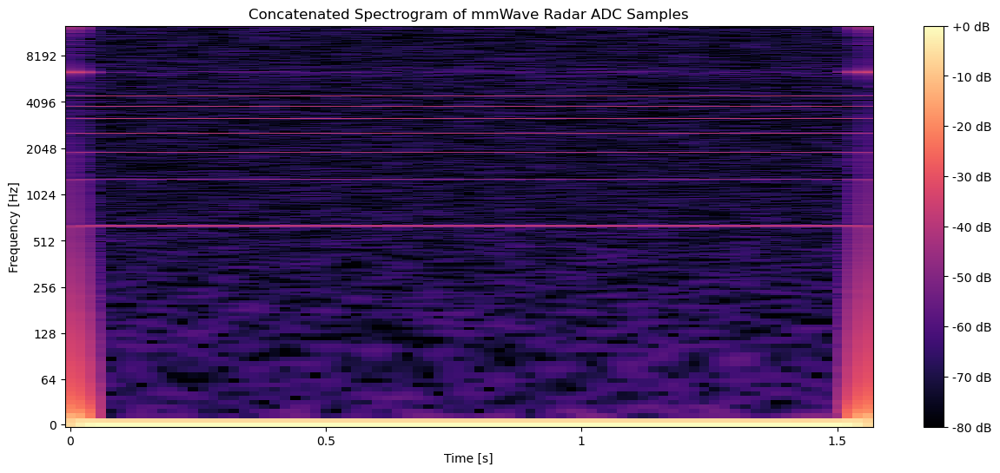

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("pipe-vibration-1000-10-256-10\\adc_data_0.bin", dtype=np.int16)

adc_data_padded = np.ones(1000*4*256*10*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(1000, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=10,
                                num_rx=4, num_samples=256)
#adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
adc_data_mean = np.mean(adc_data_sq, axis=3)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 100  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
#plt.ylim(1024,5000)
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


(1000, 1, 4, 256)
(1000, 256)
(256000,)
(4097, 501)


C:\Users\melih\AppData\Local\Temp\ipykernel_4252\2941539090.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


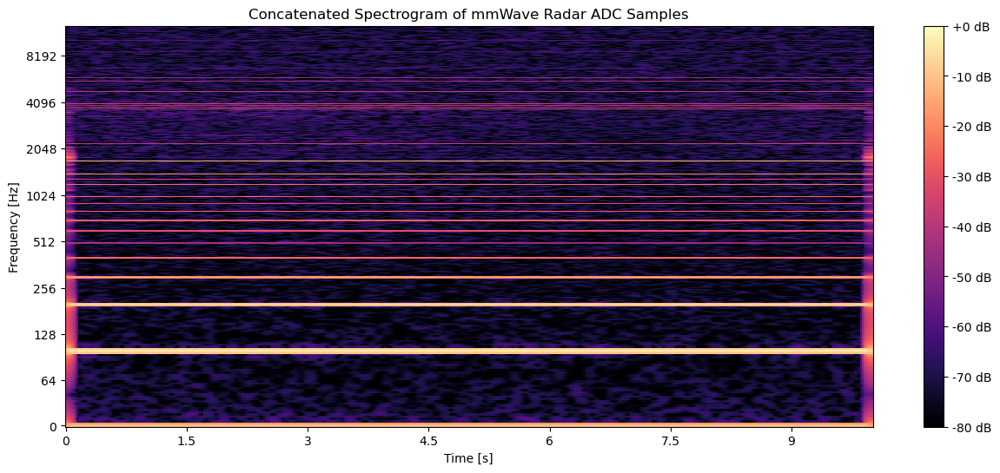

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("pipe-no-vibration-1000-10-256-10\\adc_data_1.bin", dtype=np.int16)

adc_data_padded = np.ones(1000*4*256*10*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(1000, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=10,
                                num_rx=4, num_samples=256)

adc_data = np.mean(adc_data, axis=1, keepdims=True)
print(adc_data.shape)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 100  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 * 2 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()


(1000, 1, 4, 256)
(1000, 256)
(256000,)
(4097, 501)


C:\Users\melih\AppData\Local\Temp\ipykernel_4252\2025743475.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  flattened_frames = adc_data_mean.flatten().astype(np.float32)


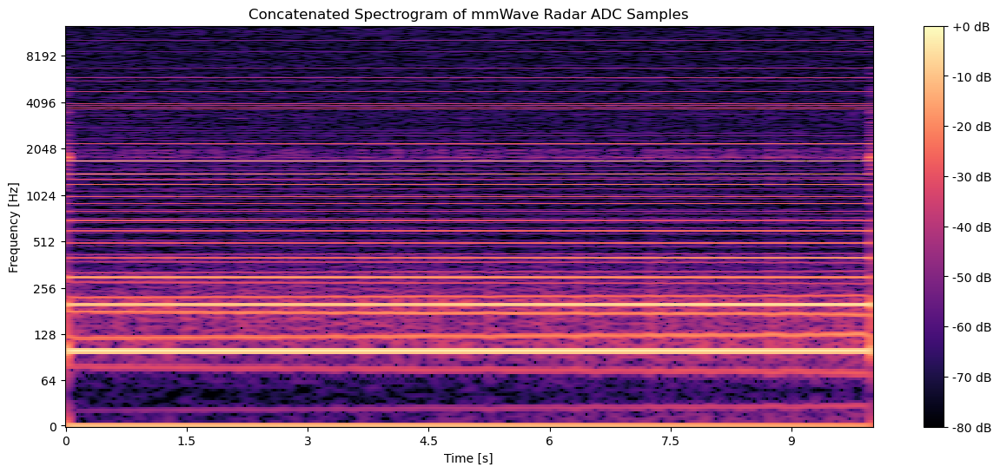

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

import numpy as np
from mmwave.dataloader import DCA1000
adc_data = np.fromfile("pipe-vibration-1000-10-256-10\\adc_data_2.bin", dtype=np.int16)

adc_data_padded = np.ones(1000*4*256*10*2)*1E-8
adc_data_padded[:adc_data.shape[0]] = adc_data        
adc_data = adc_data_padded.reshape(1000, -1)

adc_data = np.apply_along_axis(DCA1000.organize, 1, adc_data, num_chirps=10,
                                num_rx=4, num_samples=256)

adc_data = np.mean(adc_data, axis=1, keepdims=True)
print(adc_data.shape)
adc_data_sq = np.squeeze(adc_data)
adc_data_mean = np.mean(adc_data_sq, axis=1)
print(adc_data_mean.shape)
# Example data: replace this with your actual 5000 frames of 256 ADC samples


# Flatten the frames into a single 1D array
flattened_frames = adc_data_mean.flatten().astype(np.float32)
print(flattened_frames.shape)
# Parameters
Fs = 256 * 100  # Sample rate (in Hz), adjust this to your actual sample rate (256 / periodicity in seconds = 256/ (1/100) as 10 ms)   
n_fft = 4096 * 2 
hop_length =512   # Adjust based on your overlap and window size

# Compute the STFT on the flattened data
D = librosa.stft(flattened_frames, n_fft=n_fft, hop_length=hop_length)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
print(S_db.shape)

# Plot the concatenated spectrogram
plt.figure(figsize=(15, 6))
librosa.display.specshow(S_db, sr=Fs, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Concatenated Spectrogram of mmWave Radar ADC Samples')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.show()
